In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import pickle
import numpy as np

In [36]:
dataset_path = 'dataset.csv'
data = pd.read_csv(dataset_path)
data

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.2350,...,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,world-music
113996,113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.1170,...,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,world-music
113997,113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.3290,...,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,world-music
113998,113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.5060,...,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,world-music


<h1>Understanding The Data</h1>
<ul>

<li>popularity: (0-100) based on most recent, most played tracks</li>
<li>explicit: (T/F) contains explicit lyrics</li>
<li>danceability: (0.0-1.0) based on tempo, rhythm stability, beat strength</li>
<li>energy: (0.0-1.0) based on fast,loud,and noise</li>
<li>key: 0=C, 1=C#/Db, 2=D</li>
<li>mode: major = 1, minor = 0</li>
<li>speechiness: (0.0-1.0), < 0.33 non-speech like</li>
<li>acousticness: (0.0-1.0)</li>
<li>instructmentalness: (0.0-1.0) 1.0= instrucmental, "Ooh" and "ahh" are treated as instrumental</li>
<li>liveness: Listen for audience, >0.8 is likely live</li>
<li>valence: (0.0-1.0) high=happy, cheerful, euphoric. low = sad, depressed, angry</li>
<li>tempo: BPM</li>

</ul>

<h1> Cleaning Data</h1>

In [37]:
data.isnull().sum()

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [38]:
data[data["artists"].isnull()]

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,...,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


In [39]:
data.drop([65900], inplace=True)
data.isnull().sum()

Unnamed: 0          0
track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [40]:
data["artists"].value_counts()

artists
The Beatles                                                                 279
George Jones                                                                271
Stevie Wonder                                                               236
Linkin Park                                                                 224
Ella Fitzgerald                                                             222
                                                                           ... 
Automatic Tasty                                                               1
o9                                                                            1
Pyotr Ilyich Tchaikovsky;National Philharmonic Orchestra;Richard Bonynge      1
tstewart;Ólafur Arnalds                                                       1
Jesus Culture                                                                 1
Name: count, Length: 31437, dtype: int64

In [41]:
data["track_genre"].value_counts()

track_genre
acoustic             1000
afrobeat             1000
psych-rock           1000
progressive-house    1000
power-pop            1000
                     ... 
emo                  1000
electronic           1000
electro              1000
world-music          1000
k-pop                 999
Name: count, Length: 114, dtype: int64

<h1> Most Popular Song Genre</h1>
<ul>
<li>I want to check what genre is the most popular in the library, so I grouped the tracks by track_genre and sort them by the popularity score

In [42]:
data_popularity = data.groupby('track_genre')['popularity'].mean().sort_values(ascending = False).head(12)
data_popularity

track_genre
pop-film             59.283000
k-pop                56.952953
chill                53.651000
sad                  52.379000
grunge               49.594000
indian               49.539000
anime                48.772000
emo                  48.128000
sertanejo            47.866000
pop                  47.576000
progressive-house    46.615000
piano                45.273000
Name: popularity, dtype: float64

The top 12 most popular genre above came out unexpected. My suspicion was that some tracks in some genre have outliers being the very popular, thus, increasing the popularity score of the genre by a significant amount. Therefore, I excluded tracks that are above 99th percentile, which turns out to be a popularity score of 80 or below, and there are 954 tracks with a popularity score above 80

In [43]:
np.quantile(data['popularity'], 0.99)

80.0

In [44]:
(data['popularity'] > 80).value_counts()

popularity
False    113045
True        954
Name: count, dtype: int64

In [45]:
data = data[data['popularity'] < 80]
data

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
5,5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,...,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.2350,...,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,world-music
113996,113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.1170,...,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,world-music
113997,113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.3290,...,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,world-music
113998,113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.5060,...,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,world-music


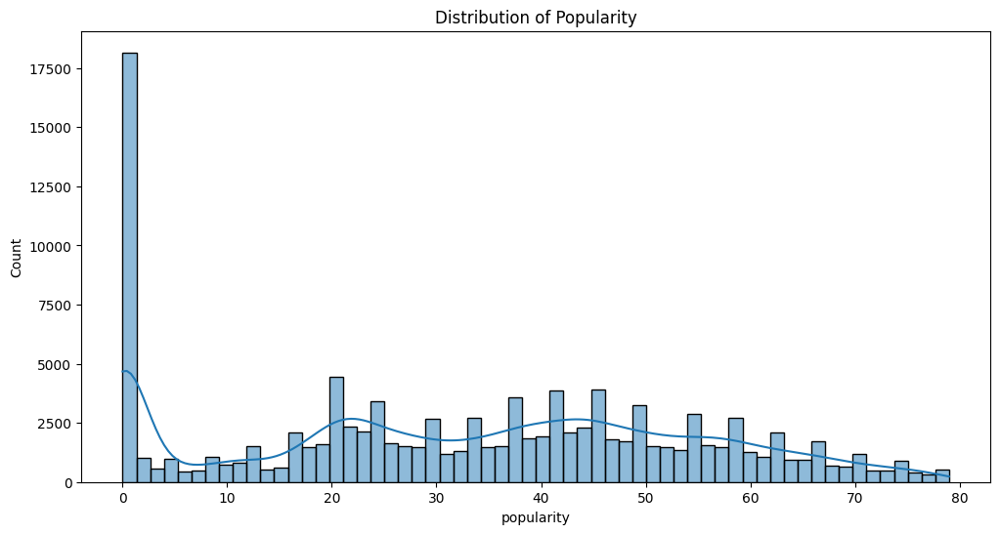

In [46]:
# Distribution of popularity
plt.figure(figsize=(12,6))
sns.histplot(data['popularity'], kde=True)
plt.title('Distribution of Popularity')
plt.show()

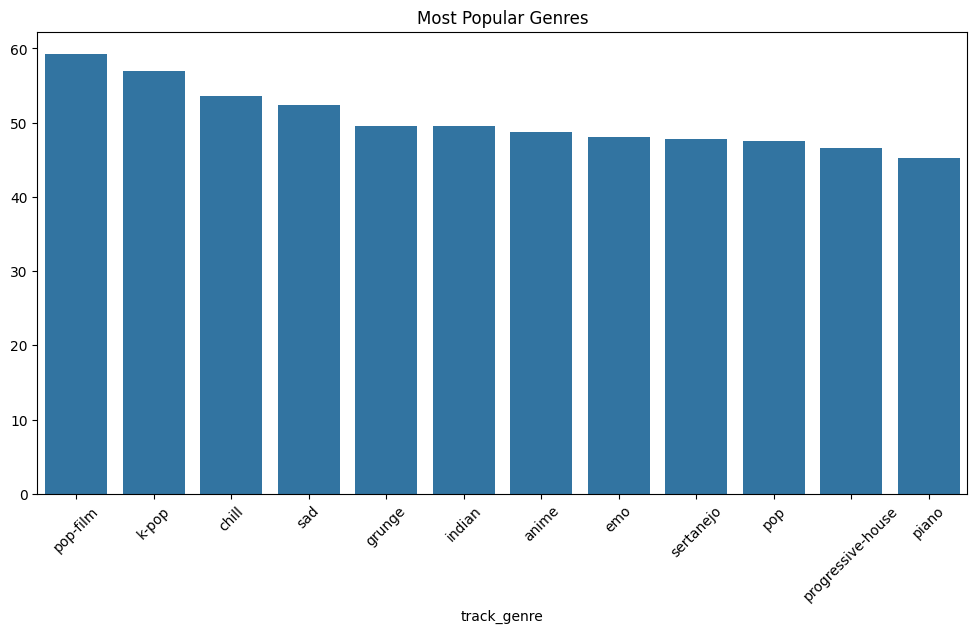

In [47]:
# Most popular genres
plt.figure(figsize=(12,6))
sns.barplot(x = data_popularity.index, y = data_popularity.values)
plt.title('Most Popular Genres')
plt.xticks(rotation=45)
plt.show()

In [48]:
# Drop data to top 12 genres
data = data[data['track_genre'].isin(data_popularity.index)]
data

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
5000,5000,1gUAX2ImxDsB3YDcyxMXlB,美波,カワキヲアメク,カワキヲアメク,71,251933,False,0.541,0.846,...,-2.729,0,0.0551,0.01220,0.000149,0.1630,0.524,129.138,4,anime
5001,5001,1di1C0QI6Y92yZPYn6XYAZ,KANA-BOON,TIME,シルエット,73,240133,False,0.436,0.934,...,-2.685,1,0.0507,0.00001,0.140000,0.3210,0.384,91.481,4,anime
5003,5003,1rN9QoVxw5U7TJkyaUR8C1,TK from Ling tosite sigure,Fantastic Magic,unravel,73,238360,False,0.508,0.889,...,-2.755,0,0.0862,0.04950,0.000000,0.0984,0.332,135.014,4,anime
5004,5004,23phSRwoMy48rwFpmuAP8q,Yoko Takahashi,残酷な天使のテーゼ/魂のルフラン,残酷な天使のテーゼ,60,247746,False,0.691,0.773,...,-5.244,0,0.0494,0.01740,0.000451,0.1170,0.502,128.162,4,anime
5005,5005,6y4GYuZszeXNOXuBFsJlos,Eve,Kaikai Kitan / Ao No Waltz,Kaikai Kitan,75,221426,False,0.584,0.911,...,-3.515,0,0.0900,0.01190,0.000000,0.1190,0.606,92.502,4,anime
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97995,97995,6L7edR8ePoAiOEthSAfeBD,Gerson Rufino,Reconstrução,Reconstrução,46,262143,False,0.769,0.718,...,-5.809,1,0.0241,0.23400,0.000000,0.1680,0.725,105.015,4,sertanejo
97996,97996,0t9X7I69027UILQB4WYCai,Chico Rey & Paraná,"Sucessos de Ouro, Vol. 15",Velha Porteira,43,224600,False,0.529,0.564,...,-4.713,1,0.0247,0.66800,0.000000,0.1960,0.594,160.445,3,sertanejo
97997,97997,6nYIAevQfh7QhuQYXYLy50,Léo & Raphael,Na Contramão do Sucesso,Aqui É Parana Cunhado,44,153426,False,0.690,0.926,...,-5.584,0,0.1830,0.33600,0.000000,0.0319,0.867,178.119,4,sertanejo
97998,97998,7ALQOUgUrUifvmcGMCyvld,Os Serranos,"Os Serranos Interpretam Sucessos Gaúchos, Vol. 3",O Casamento de Doralice,44,250600,False,0.763,0.769,...,-6.245,1,0.0292,0.23500,0.000041,0.0545,0.857,92.035,4,sertanejo


<h1> Independant Vs Dependant</h1>

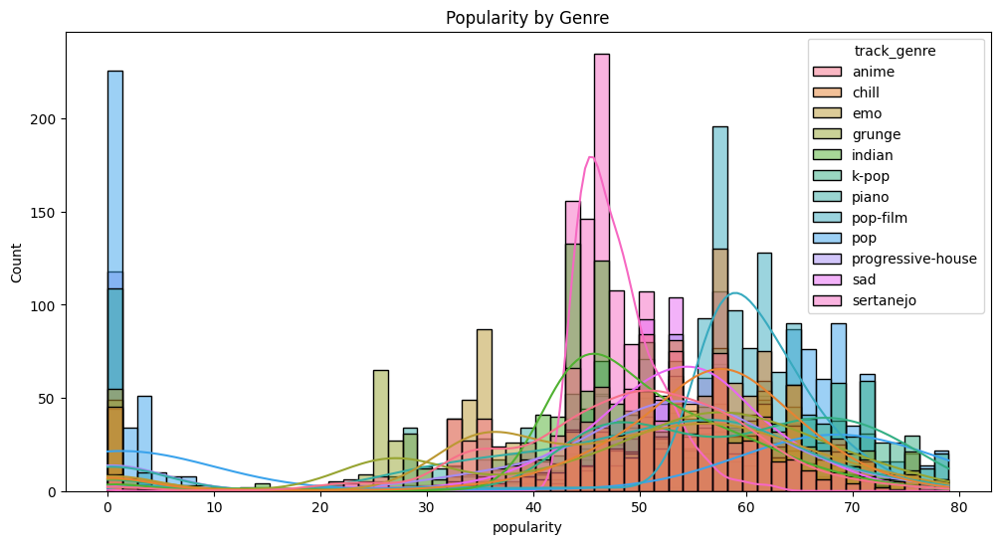

In [49]:
# Distribution of popularity by genre
plt.figure(figsize=(12,6))
sns.histplot(data, x='popularity', hue='track_genre', kde=True)
plt.title('Popularity by Genre')
plt.show()

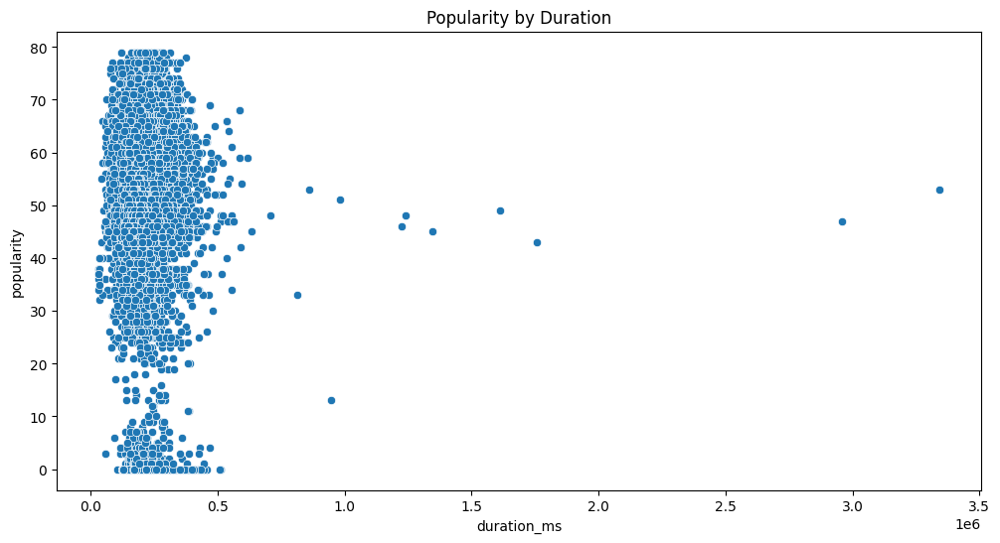

PearsonRResult(statistic=0.005498890577077307, pvalue=0.550443003355813)


In [50]:
# import pearson r
from scipy.stats import pearsonr

plt.figure(figsize=(12,6))
sns.scatterplot(x='duration_ms', y='popularity', data=data)
plt.title('Popularity by Duration')
plt.show()
corr = pearsonr(data['duration_ms'], data['popularity'])
print(corr)

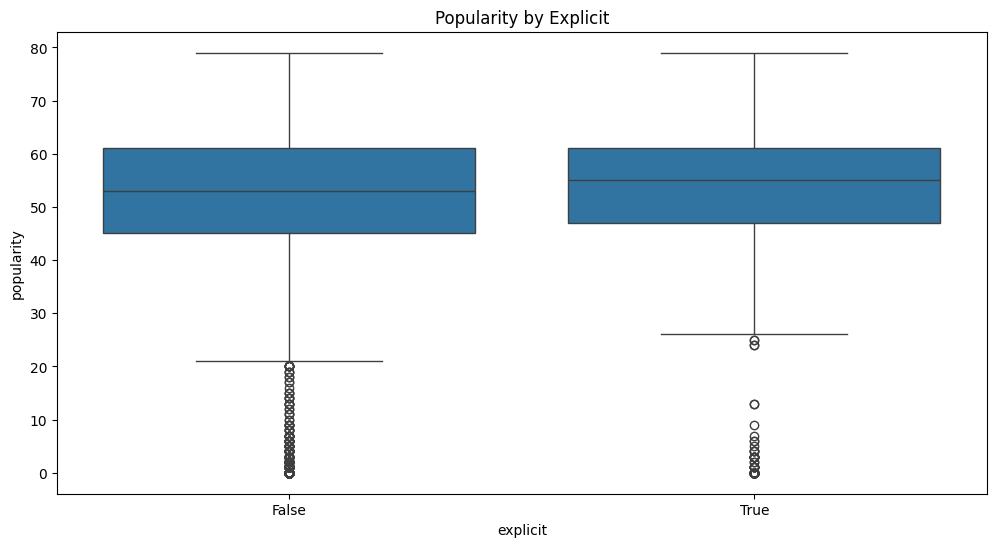

PearsonRResult(statistic=0.023633517794958758, pvalue=0.010270634663018943)


In [51]:
plt.figure(figsize=(12,6))
sns.boxplot(x='explicit', y='popularity', data=data)
plt.title('Popularity by Explicit')
plt.show()
corr = pearsonr(data['explicit'], data['popularity'])
print(corr)

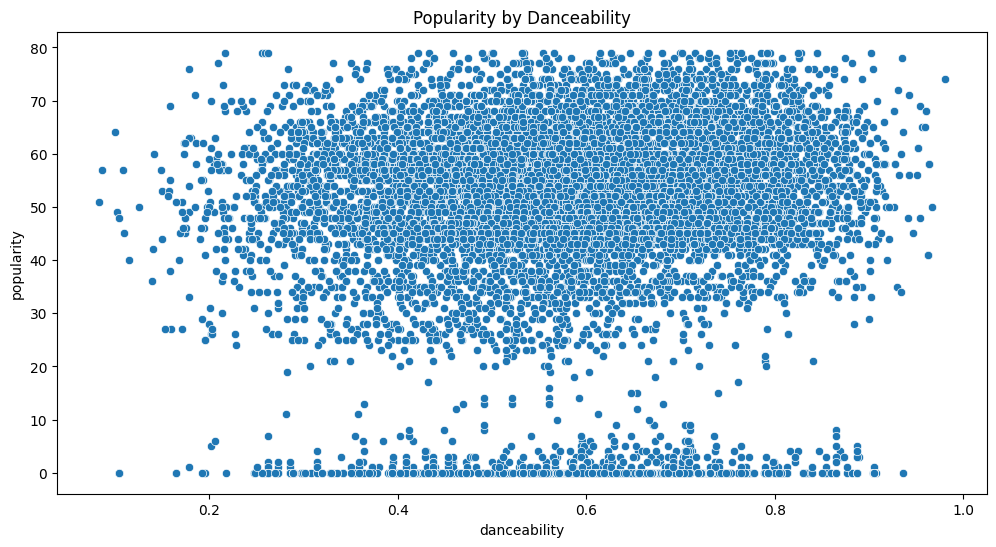

PearsonRResult(statistic=0.06957912386558984, pvalue=3.898009389093907e-14)


In [52]:
# Popularity vs Danceability
plt.figure(figsize=(12,6))
sns.scatterplot(x='danceability', y='popularity', data=data)
plt.title('Popularity by Danceability')
plt.show()
corr = pearsonr(data['danceability'], data['popularity'])
print(corr)

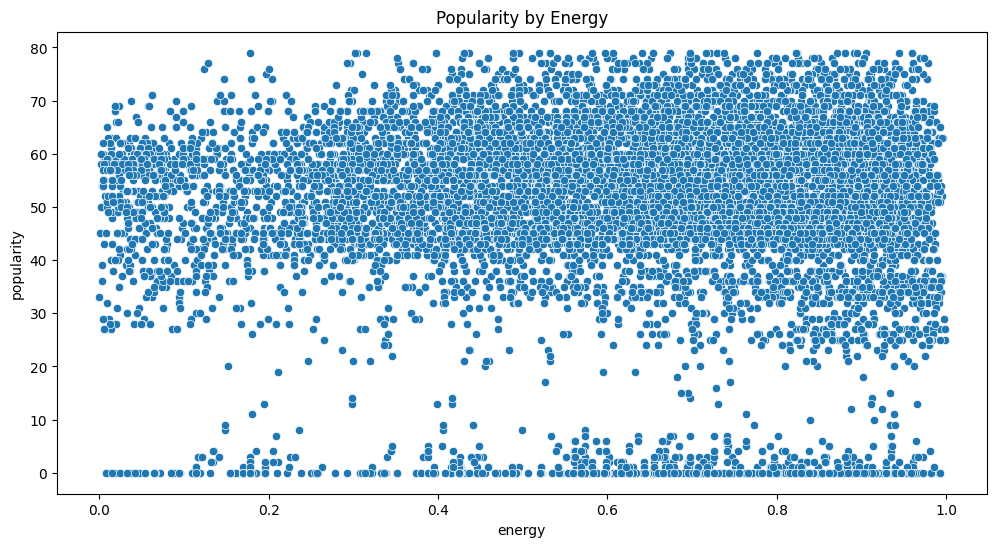

PearsonRResult(statistic=-0.023068858567469222, pvalue=0.01223669839292133)


In [53]:
# Popularity vs Energy
plt.figure(figsize=(12,6))
sns.scatterplot(x='energy', y='popularity', data=data)
plt.title('Popularity by Energy')
plt.show()
corr = pearsonr(data['energy'], data['popularity'])
print(corr)

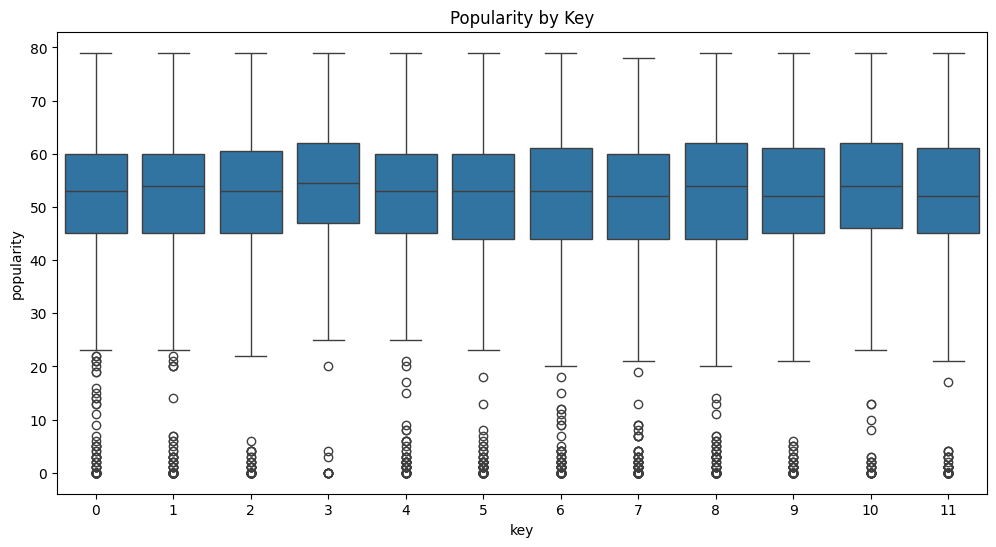

PearsonRResult(statistic=-0.007217312165868271, pvalue=0.4332189051492278)


In [54]:
# Popularity vs key
plt.figure(figsize=(12,6))
sns.boxplot(x='key', y='popularity', data=data)
plt.title('Popularity by Key')
plt.show()
corr = pearsonr(data['key'], data['popularity'])
print(corr)

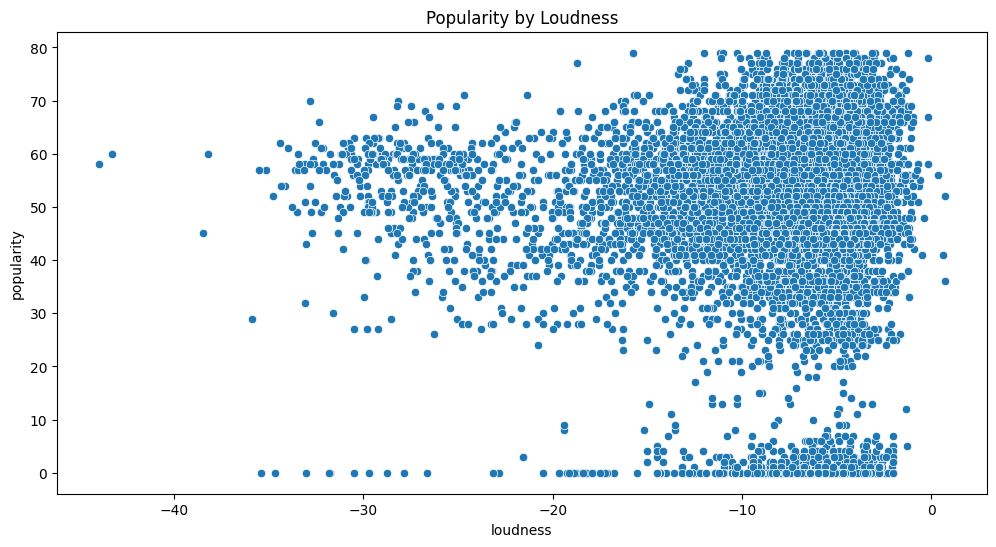

PearsonRResult(statistic=-0.00407196809032649, pvalue=0.6583787137923296)


In [55]:
# Popularity vs loudness
plt.figure(figsize=(12,6))
sns.scatterplot(x='loudness', y='popularity', data=data)
plt.title('Popularity by Loudness')
plt.show()
corr = pearsonr(data['loudness'], data['popularity'])
print(corr)

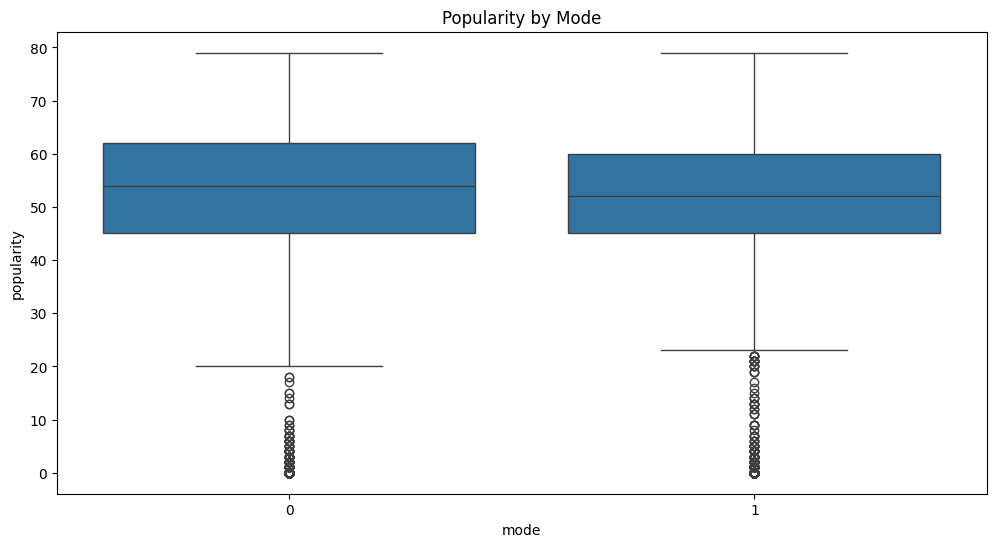

PearsonRResult(statistic=-0.032911977708486376, pvalue=0.0003506500857281193)


In [56]:
# popularity vs mode
plt.figure(figsize=(12,6))
sns.boxplot(x='mode', y='popularity', data=data)
plt.title('Popularity by Mode')
plt.show()
corr = pearsonr(data['mode'], data['popularity'])
print(corr)

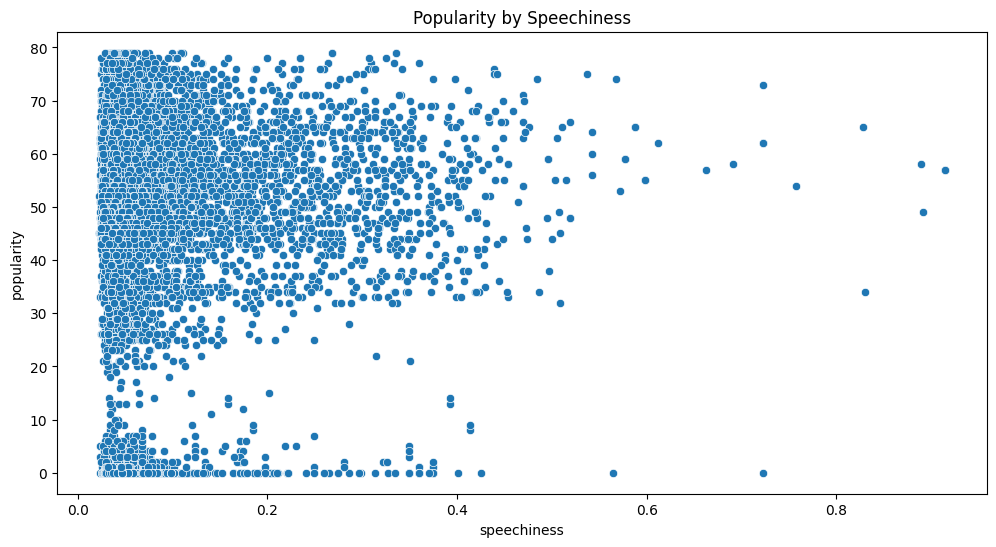

PearsonRResult(statistic=0.024391324901458806, pvalue=0.008075342052845132)


In [57]:
# popularity vs speechiness
plt.figure(figsize=(12,6))
sns.scatterplot(x='speechiness', y='popularity', data=data)
plt.title('Popularity by Speechiness')
plt.show()
corr = pearsonr(data['speechiness'], data['popularity'])
print(corr)

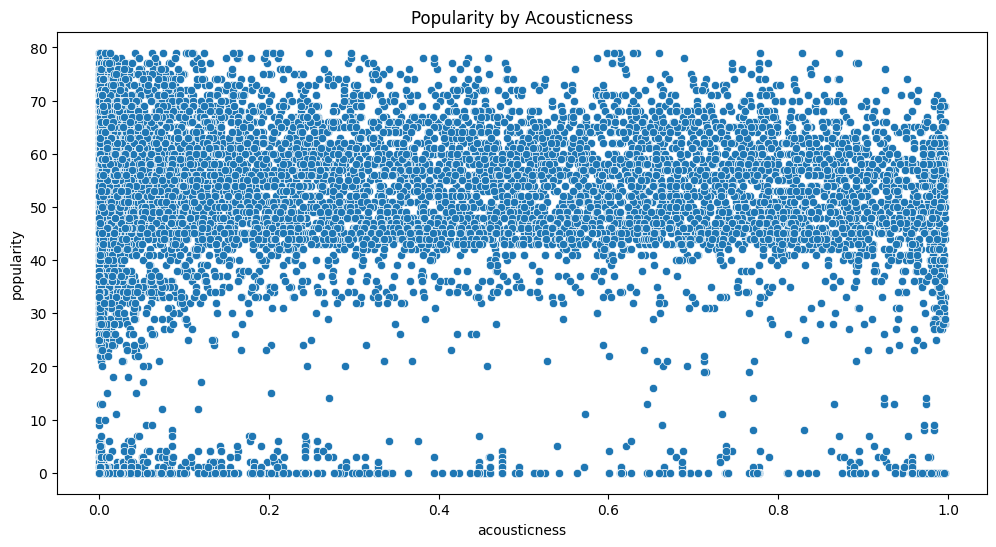

PearsonRResult(statistic=0.03013713544367878, pvalue=0.0010635368575045445)


In [58]:
# popularity vs acousticness
plt.figure(figsize=(12,6))
sns.scatterplot(x='acousticness', y='popularity', data=data)
plt.title('Popularity by Acousticness')
plt.show()
corr = pearsonr(data['acousticness'], data['popularity'])
print(corr)

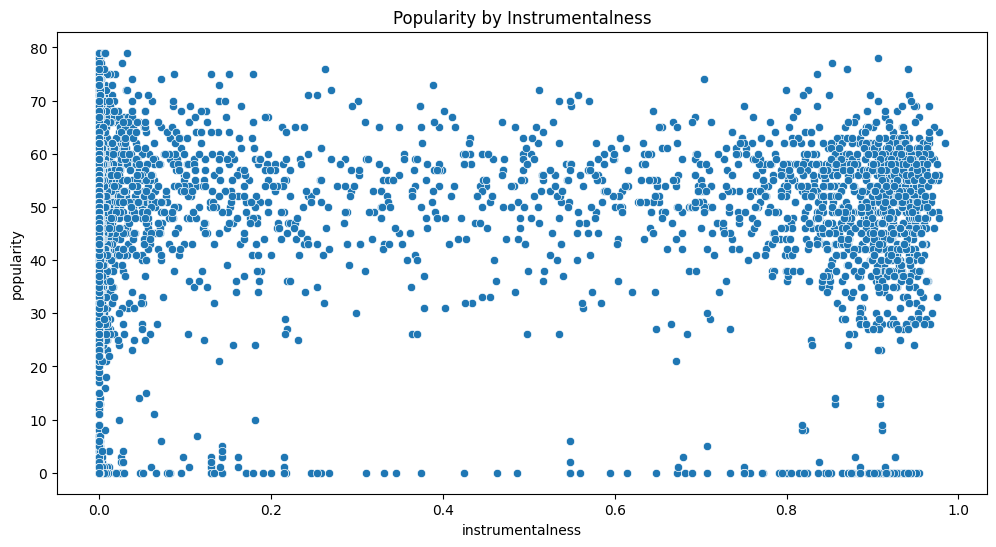

PearsonRResult(statistic=-0.052897988881982334, pvalue=9.035698082253365e-09)


In [59]:
# popularity vs instrumentalness
plt.figure(figsize=(12,6))
sns.scatterplot(x='instrumentalness', y='popularity', data=data)
plt.title('Popularity by Instrumentalness')
plt.show()
corr = pearsonr(data['instrumentalness'], data['popularity'])
print(corr)

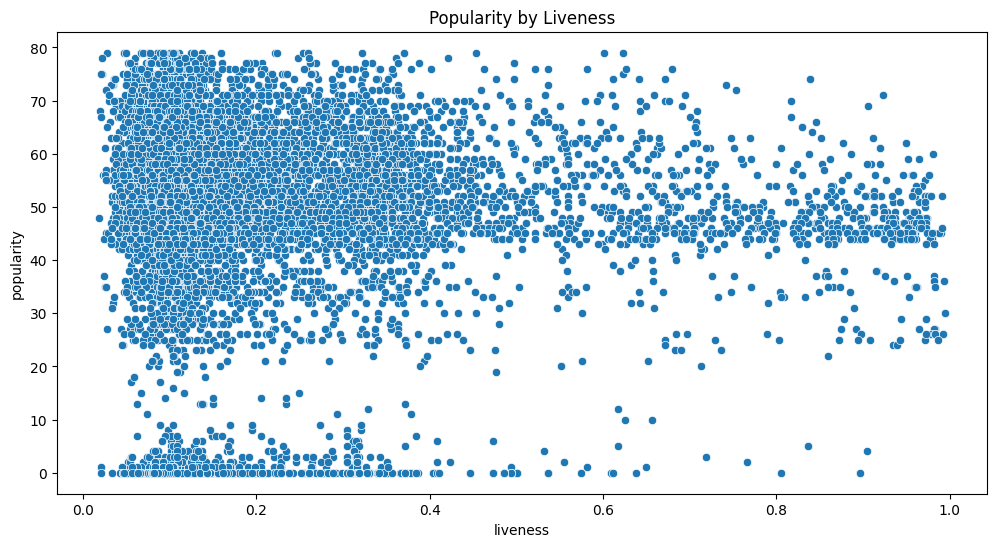

PearsonRResult(statistic=-0.04070951536542727, pvalue=9.768380169339977e-06)


In [60]:
# popularity vs liveness
plt.figure(figsize=(12,6))
sns.scatterplot(x='liveness', y='popularity', data=data)
plt.title('Popularity by Liveness')
plt.show()
corr = pearsonr(data['liveness'], data['popularity'])
print(corr)

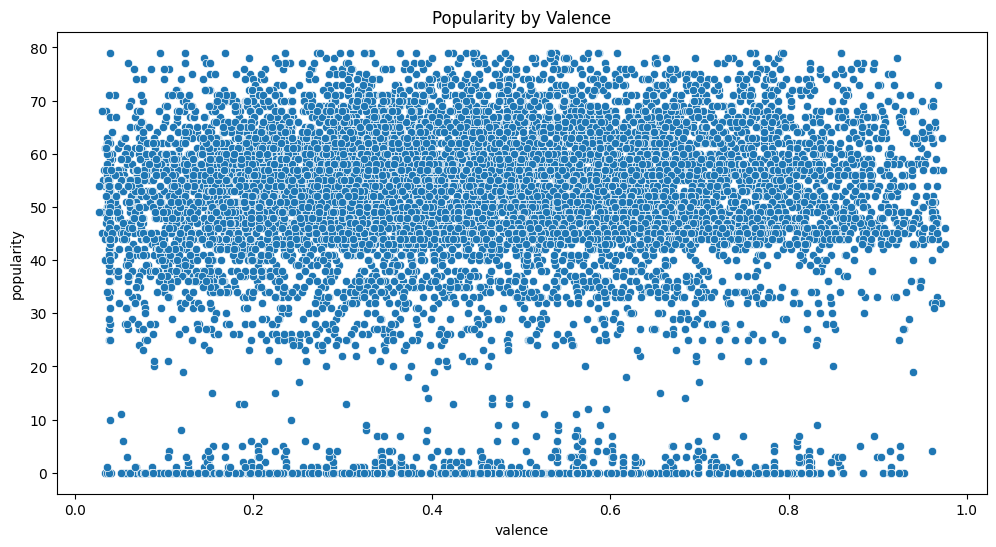

PearsonRResult(statistic=0.030495959037042213, pvalue=0.0009258334496593798)


In [61]:
# popularity vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='popularity', data=data)
plt.title('Popularity by Valence')
plt.show()
corr = pearsonr(data['valence'], data['popularity'])
print(corr)

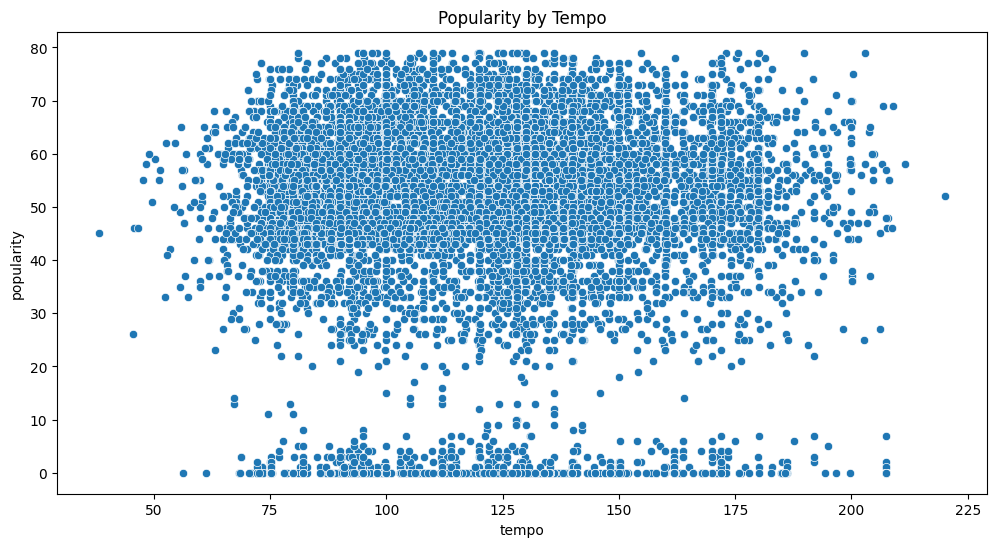

PearsonRResult(statistic=-0.03745865127620544, pvalue=4.7247642800107315e-05)


In [62]:
# popularity vs tempo
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='popularity', data=data)
plt.title('Popularity by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['popularity'])
print(corr)

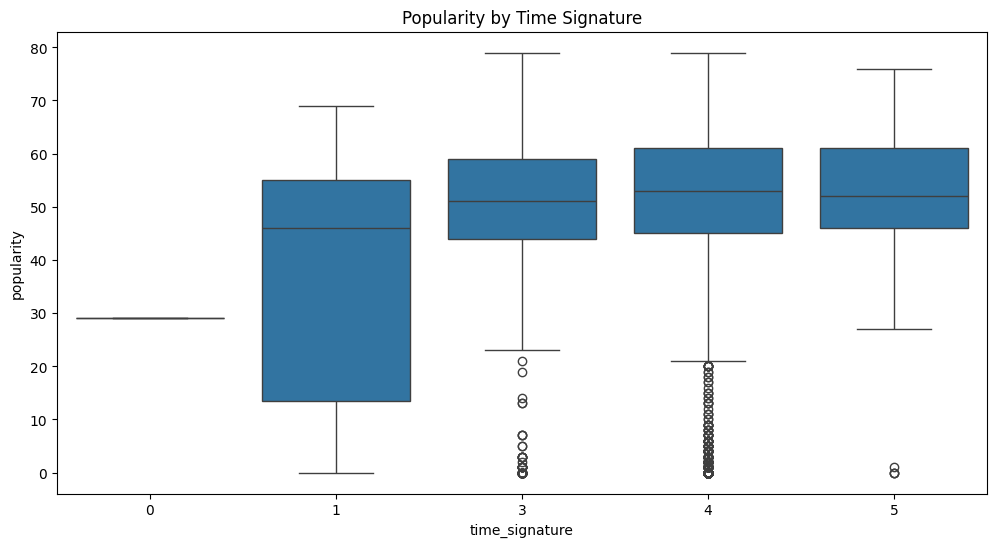

PearsonRResult(statistic=0.07047118270893649, pvalue=1.836682253695926e-14)


In [63]:
# popularity vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='popularity', data=data)
plt.title('Popularity by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['popularity'])
print(corr)

<h1> Independant Vs Independant (duration) </h1>

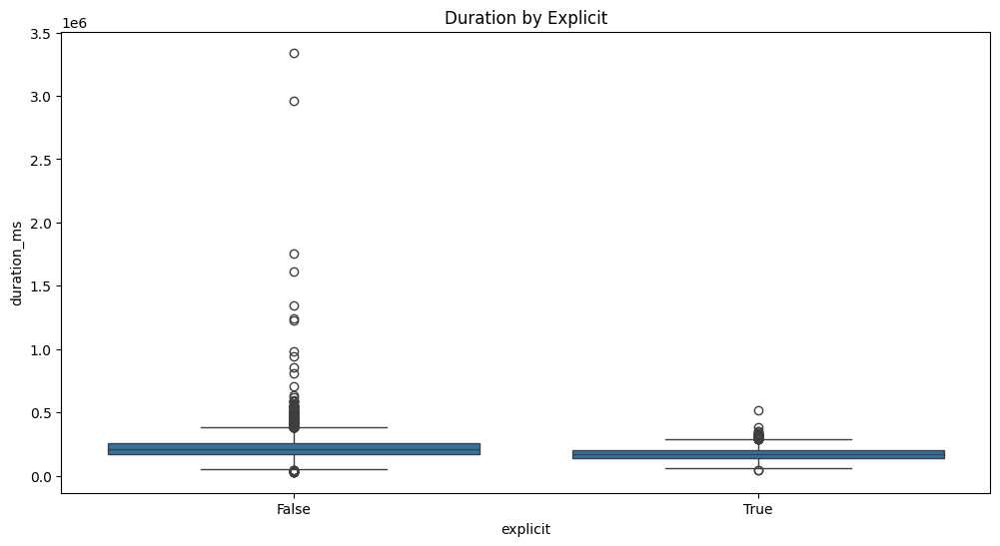

PearsonRResult(statistic=-0.18278744451990334, pvalue=3.942810980398628e-89)


In [64]:
# duration vs explicit
plt.figure(figsize=(12,6))
sns.boxplot(x='explicit', y='duration_ms', data=data)
plt.title('Duration by Explicit')
plt.show()
corr = pearsonr(data['explicit'], data['duration_ms'])
print(corr)

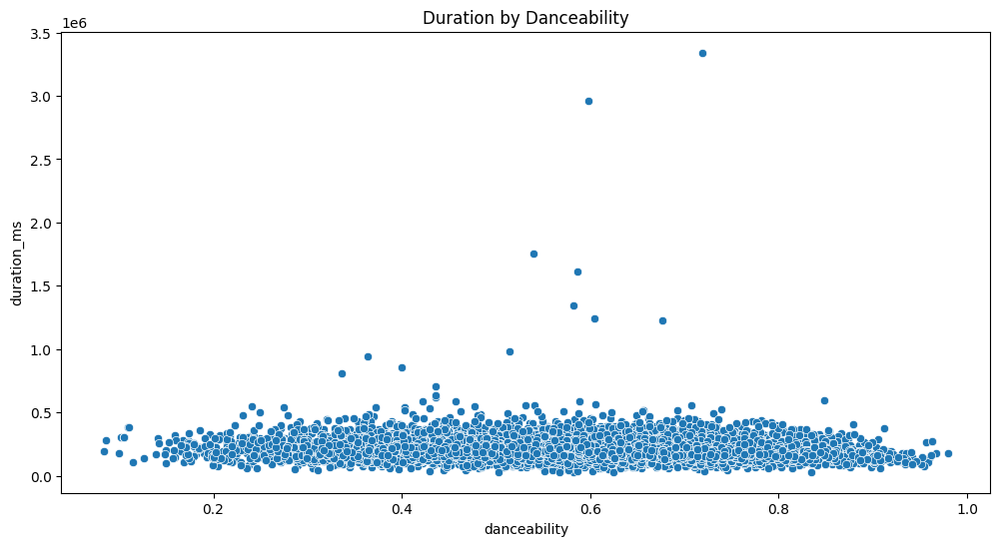

PearsonRResult(statistic=-0.16371610102834294, pvalue=1.2258213854085848e-71)


In [65]:
# duration vs danceability
plt.figure(figsize=(12,6))
sns.scatterplot(x='danceability', y='duration_ms', data=data)
plt.title('Duration by Danceability')
plt.show()
corr = pearsonr(data['danceability'], data['duration_ms'])
print(corr)

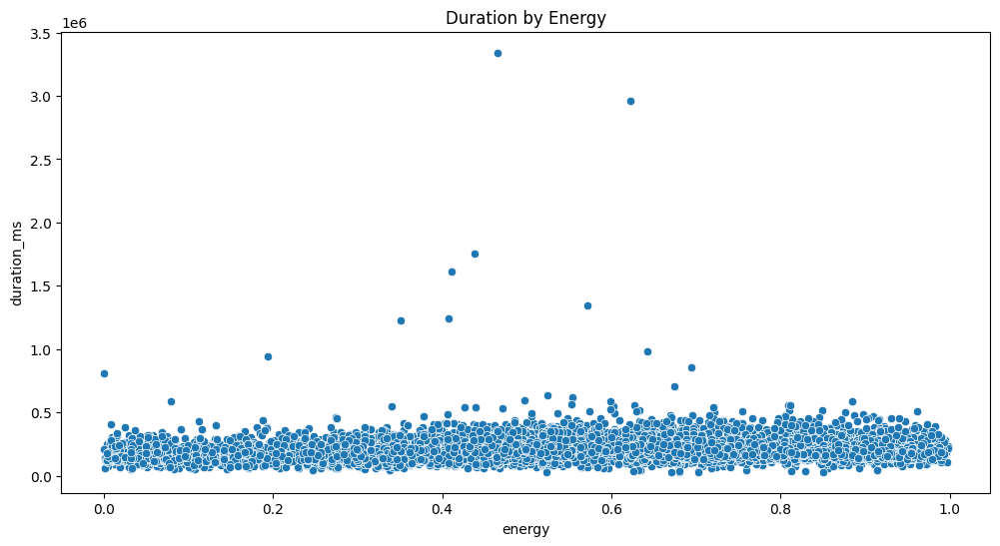

PearsonRResult(statistic=0.14224377506607205, pvalue=2.3719622646304508e-54)


In [66]:
# duration vs energy
plt.figure(figsize=(12,6))
sns.scatterplot(x='energy', y='duration_ms', data=data)
plt.title('Duration by Energy')
plt.show()
corr = pearsonr(data['energy'], data['duration_ms'])
print(corr)

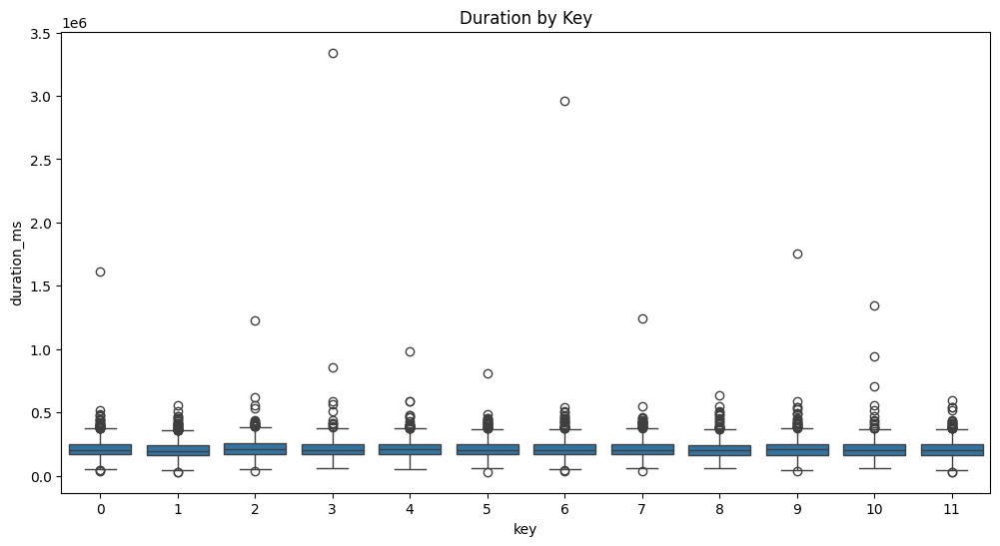

PearsonRResult(statistic=0.003921722917936987, pvalue=0.6702256993749269)


In [67]:
# duration vs key
plt.figure(figsize=(12,6))
sns.boxplot(x='key', y='duration_ms', data=data)
plt.title('Duration by Key')   
plt.show()
corr = pearsonr(data['key'], data['duration_ms'])
print(corr)


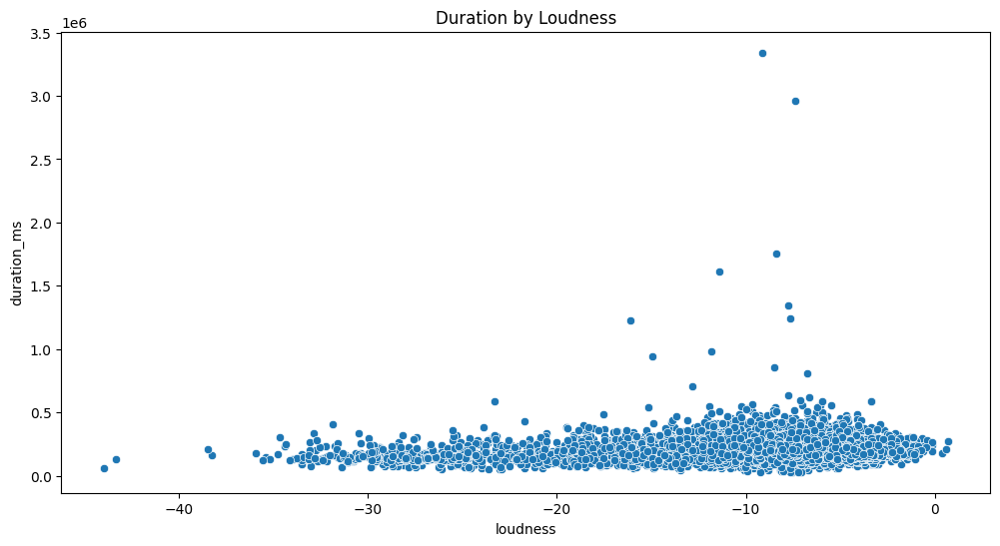

PearsonRResult(statistic=0.13625811737301494, pvalue=5.575222197313982e-50)


In [68]:
# duration vs loudness
plt.figure(figsize=(12,6))
sns.scatterplot(x='loudness', y='duration_ms', data=data)
plt.title('Duration by Loudness')
plt.show()
corr = pearsonr(data['loudness'], data['duration_ms'])
print(corr)

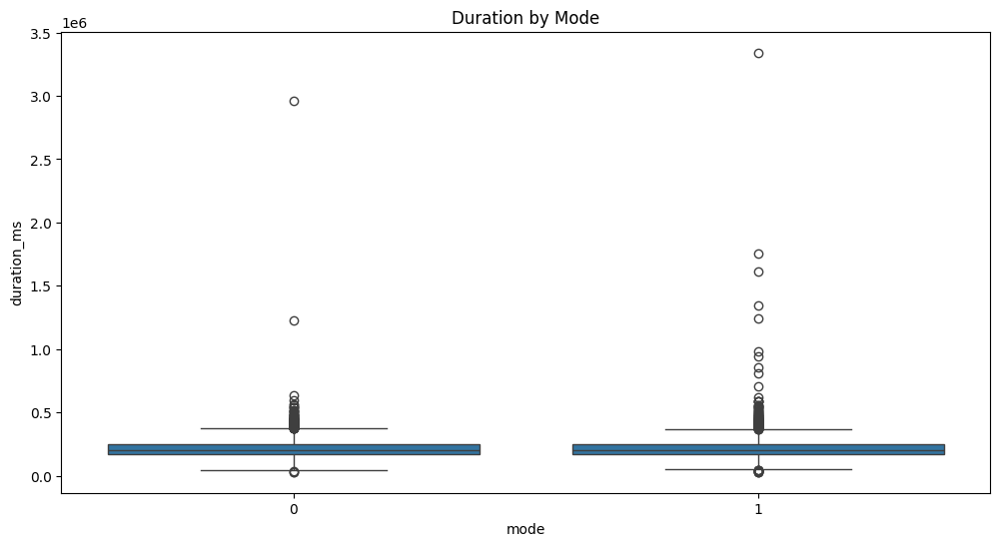

PearsonRResult(statistic=-0.0017846649037131907, pvalue=0.8463431903276173)


In [69]:
# duration vs mode
plt.figure(figsize=(12,6))
sns.boxplot(x='mode', y='duration_ms', data=data)
plt.title('Duration by Mode')
plt.show()
corr = pearsonr(data['mode'], data['duration_ms'])
print(corr)

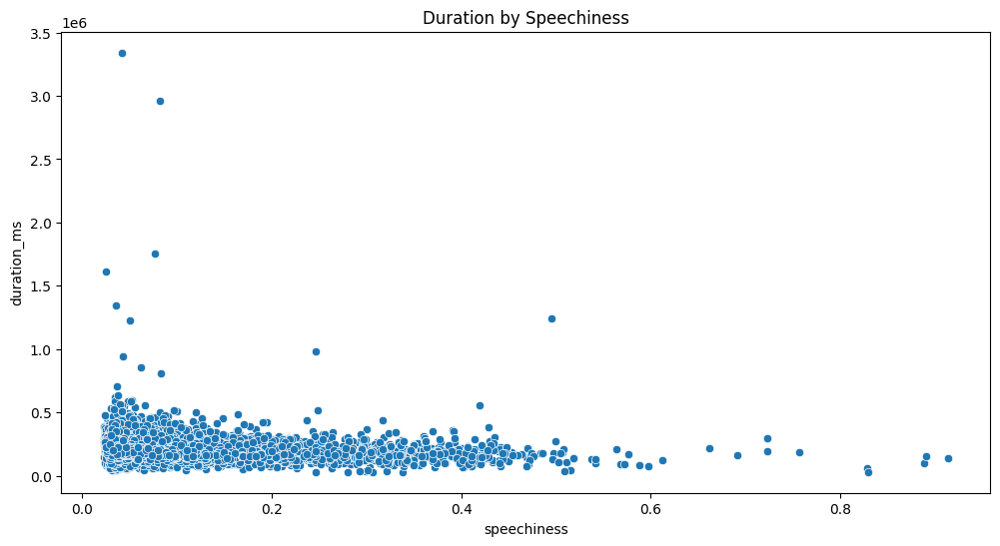

PearsonRResult(statistic=-0.15360590776674066, pvalue=3.4870710620838414e-63)


In [70]:
# duration vs speechiness 
plt.figure(figsize=(12,6))
sns.scatterplot(x='speechiness', y='duration_ms', data=data)
plt.title('Duration by Speechiness')
plt.show()
corr = pearsonr(data['speechiness'], data['duration_ms'])
print(corr)

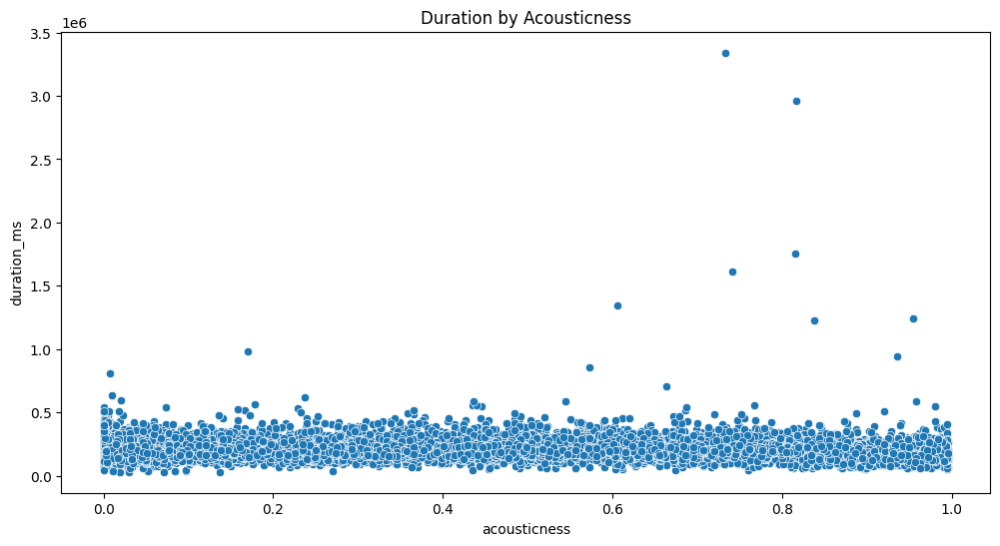

PearsonRResult(statistic=-0.06106702813572469, pvalue=3.199126380235003e-11)


In [71]:
# duration vs acousticness
plt.figure(figsize=(12,6))
sns.scatterplot(x='acousticness', y='duration_ms', data=data)
plt.title('Duration by Acousticness')
plt.show()
corr = pearsonr(data['acousticness'], data['duration_ms'])
print(corr)

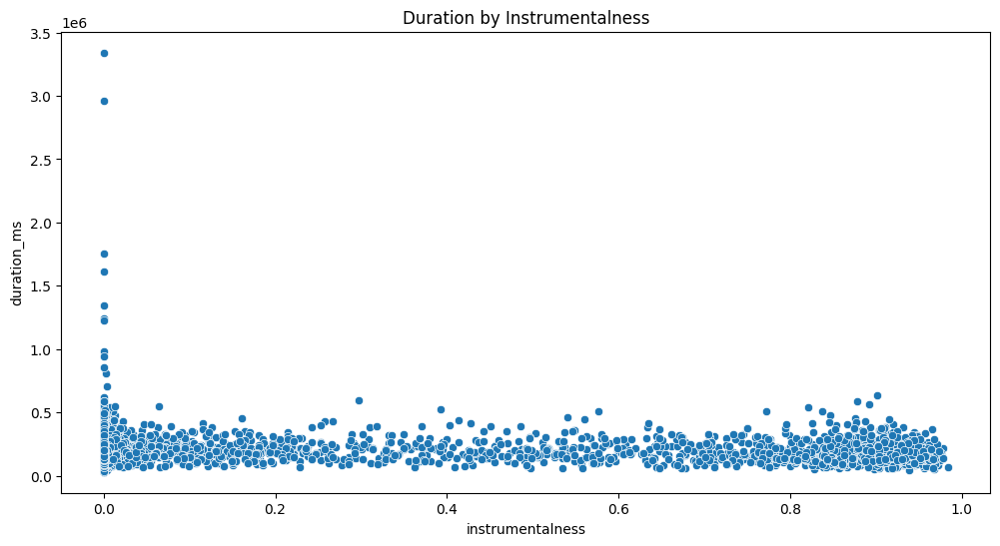

PearsonRResult(statistic=-0.14188518982435178, pvalue=4.389665886227164e-54)


In [72]:
# duration vs instrumentalness
plt.figure(figsize=(12,6))
sns.scatterplot(x='instrumentalness', y='duration_ms', data=data)
plt.title('Duration by Instrumentalness')
plt.show()
corr = pearsonr(data['instrumentalness'], data['duration_ms'])
print(corr)

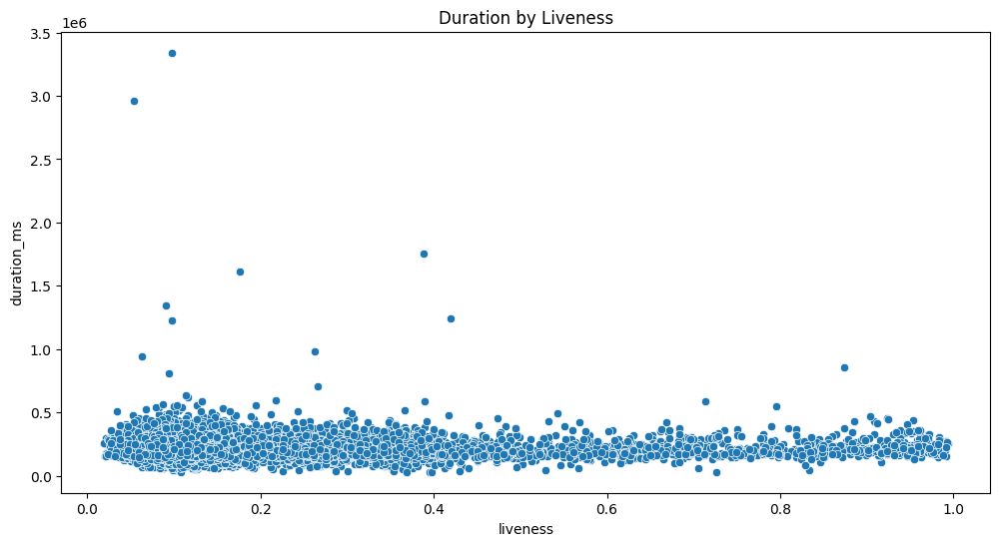

PearsonRResult(statistic=0.003787406870215145, pvalue=0.6808866453786646)


In [73]:
# duration vs liveness
plt.figure(figsize=(12,6))
sns.scatterplot(x='liveness', y='duration_ms', data=data)
plt.title('Duration by Liveness')
plt.show()
corr = pearsonr(data['liveness'], data['duration_ms'])
print(corr)


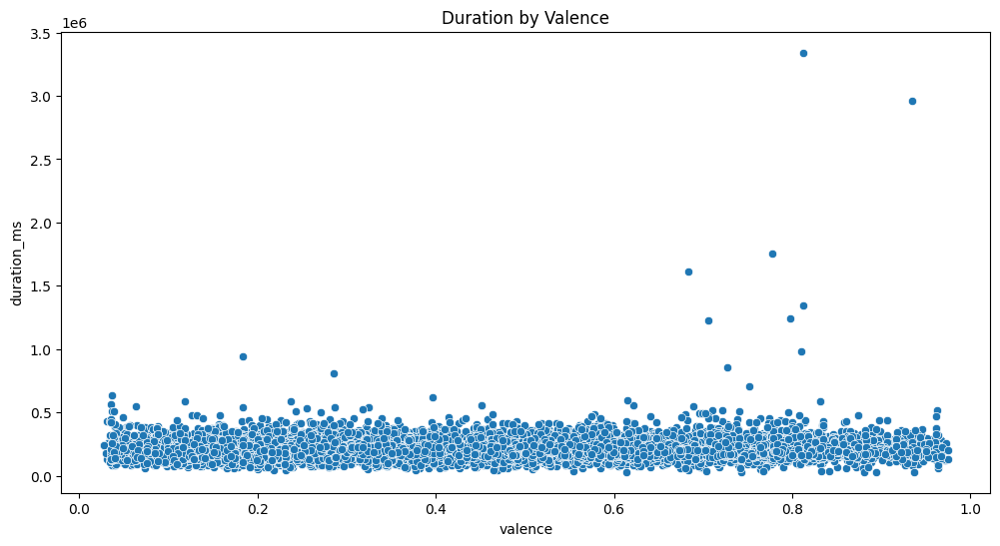

PearsonRResult(statistic=0.036088859775797816, pvalue=8.856658047186412e-05)


In [74]:
# duration vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='duration_ms', data=data)
plt.title('Duration by Valence')
plt.show()
corr = pearsonr(data['valence'], data['duration_ms'])
print(corr)

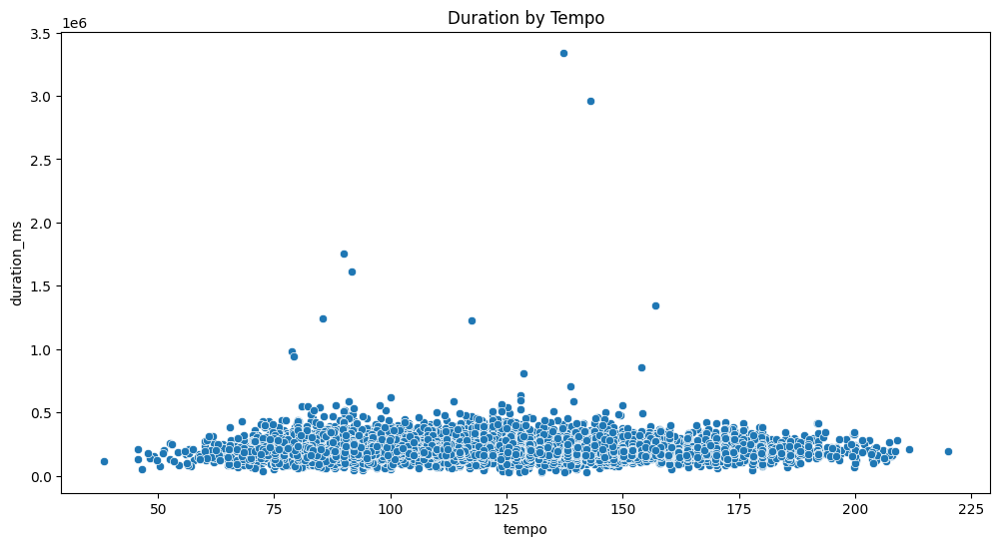

PearsonRResult(statistic=0.0023776070398340487, pvalue=0.7962752379727012)


In [75]:
# duration vs tempo
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='duration_ms', data=data)
plt.title('Duration by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['duration_ms'])
print(corr)

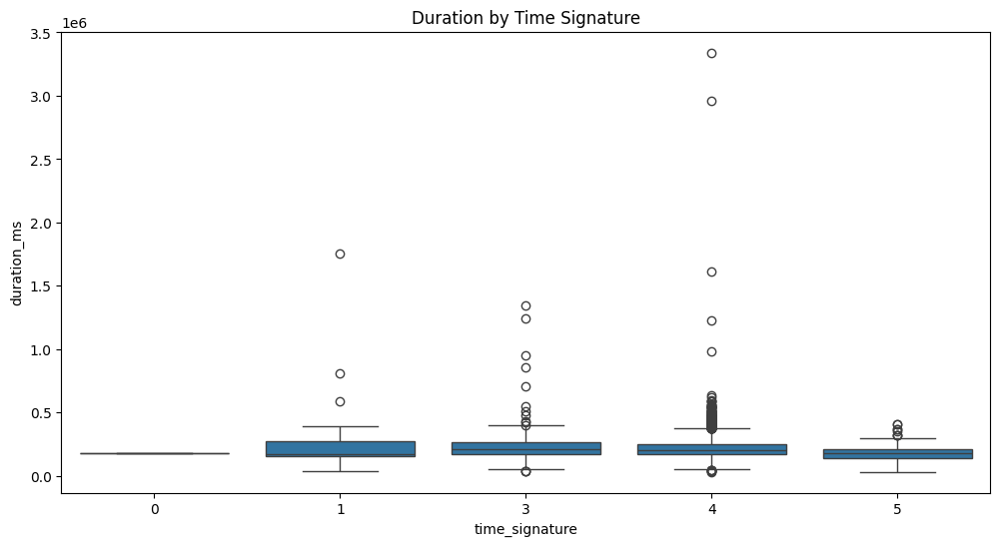

PearsonRResult(statistic=-0.04256022272620918, pvalue=3.773970432821087e-06)


In [76]:
# duration vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='duration_ms', data=data)
plt.title('Duration by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['duration_ms'])
print(corr)

<h1> Independant Vs Independant (Danceability) </h1>

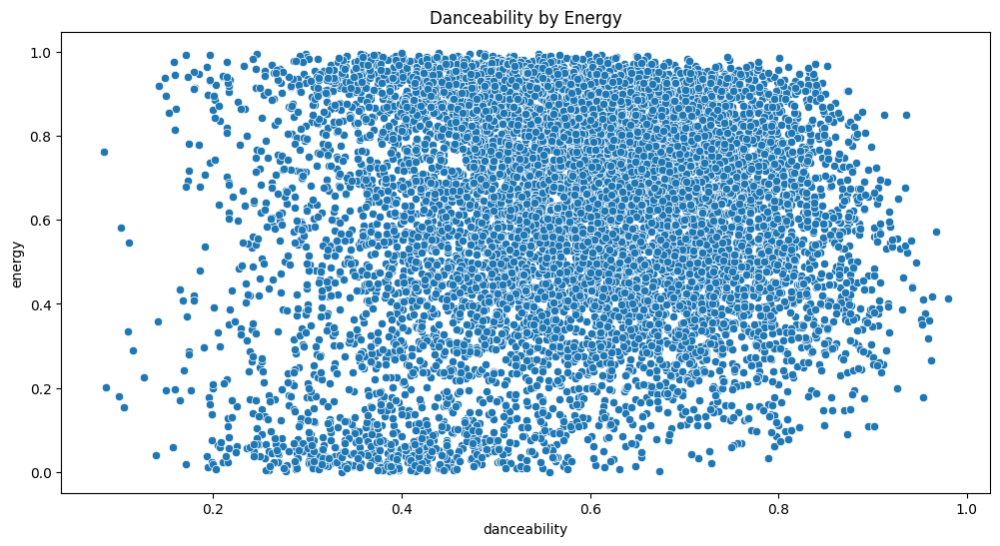

PearsonRResult(statistic=0.04917454273670034, pvalue=9.15196321974111e-08)


In [77]:
# Danceability vs energy
plt.figure(figsize=(12,6))
sns.scatterplot(x='danceability', y='energy', data=data)
plt.title('Danceability by Energy')
plt.show()
corr = pearsonr(data['danceability'], data['energy'])
print(corr)

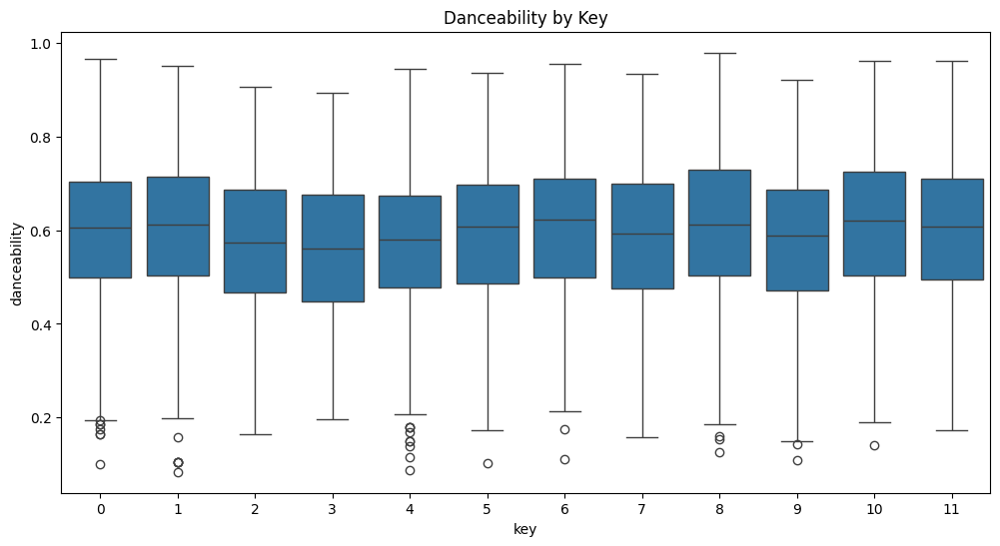

PearsonRResult(statistic=0.020633432059841562, pvalue=0.025045479948797914)


In [78]:
# Danceability vs key
plt.figure(figsize=(12,6))
sns.boxplot(x='key', y='danceability', data=data)
plt.title('Danceability by Key')
plt.show()
corr = pearsonr(data['key'], data['danceability'])
print(corr)

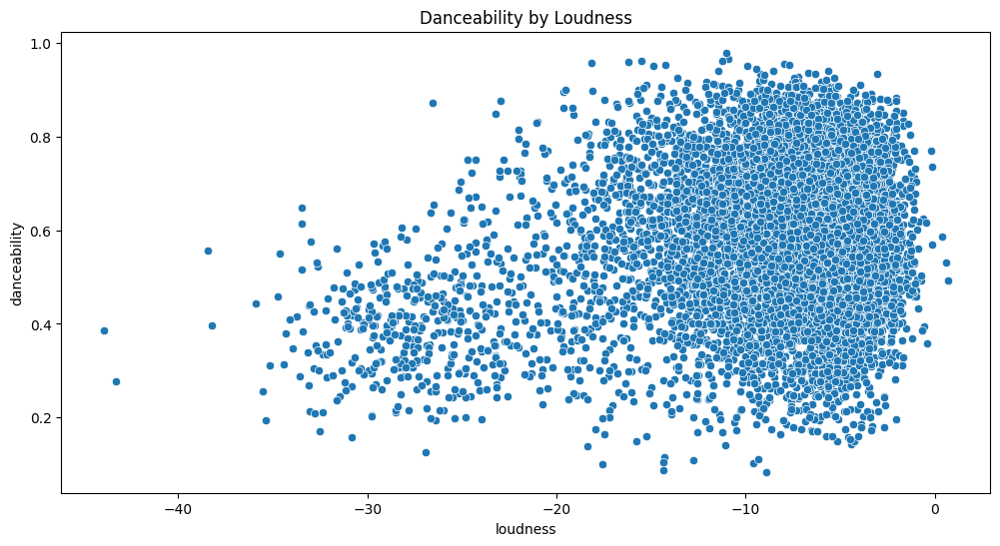

PearsonRResult(statistic=0.15418873154826268, pvalue=1.175920845378918e-63)


In [79]:
# Danceability vs loudness
plt.figure(figsize=(12,6))
sns.scatterplot(x='loudness', y='danceability', data=data)
plt.title('Danceability by Loudness')
plt.show()
corr = pearsonr(data['loudness'], data['danceability'])
print(corr)

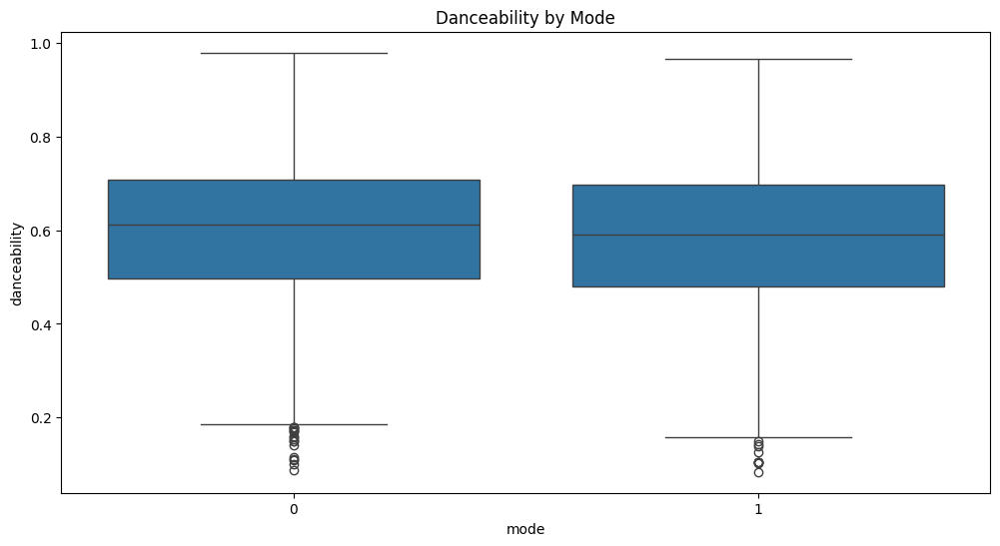

PearsonRResult(statistic=-0.05785958787535388, pvalue=3.2179485819324374e-10)


In [80]:
# Danceability vs mode
plt.figure(figsize=(12,6))
sns.boxplot(x='mode', y='danceability', data=data)
plt.title('Danceability by Mode')
plt.show()
corr = pearsonr(data['mode'], data['danceability'])
print(corr)

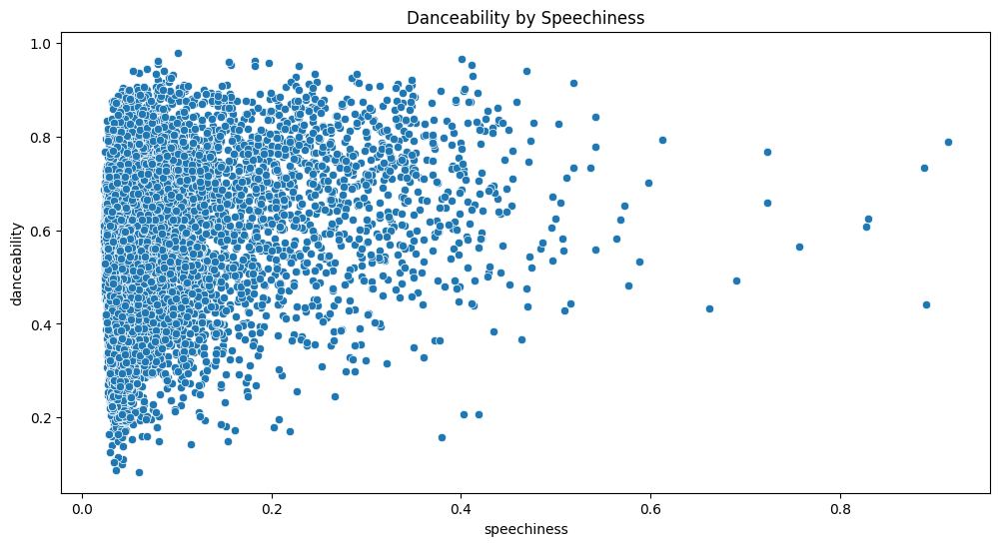

PearsonRResult(statistic=0.2070268908518857, pvalue=2.453660617180836e-114)


In [81]:
# Danceability vs speechiness
plt.figure(figsize=(12,6))
sns.scatterplot(x='speechiness', y='danceability', data=data)
plt.title('Danceability by Speechiness')
plt.show()
corr = pearsonr(data['speechiness'], data['danceability'])
print(corr)


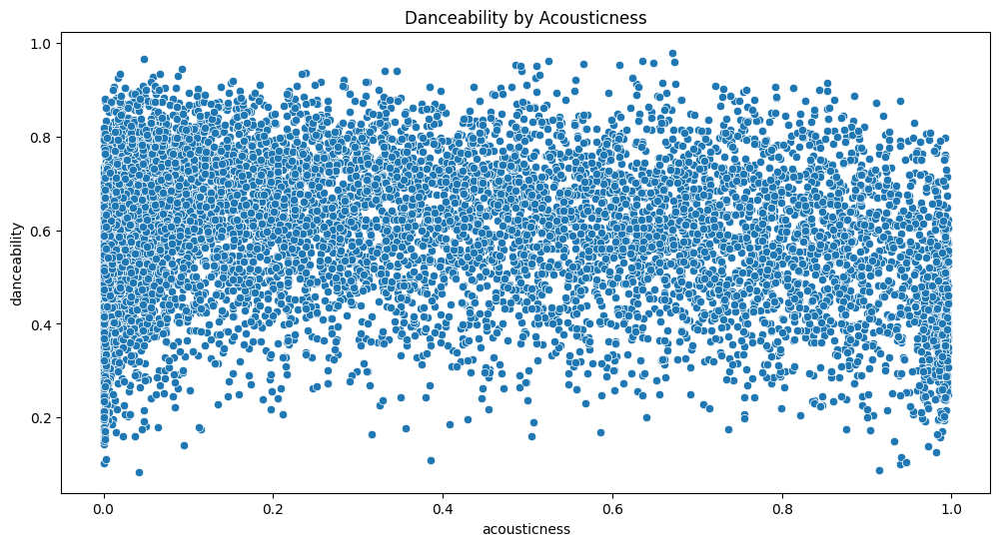

PearsonRResult(statistic=-0.10392676811849708, pvalue=1.1004597781255922e-29)


In [82]:
# Danceability vs acousticness
plt.figure(figsize=(12,6))
sns.scatterplot(x='acousticness', y='danceability', data=data)
plt.title('Danceability by Acousticness')
plt.show()
corr = pearsonr(data['acousticness'], data['danceability'])
print(corr)

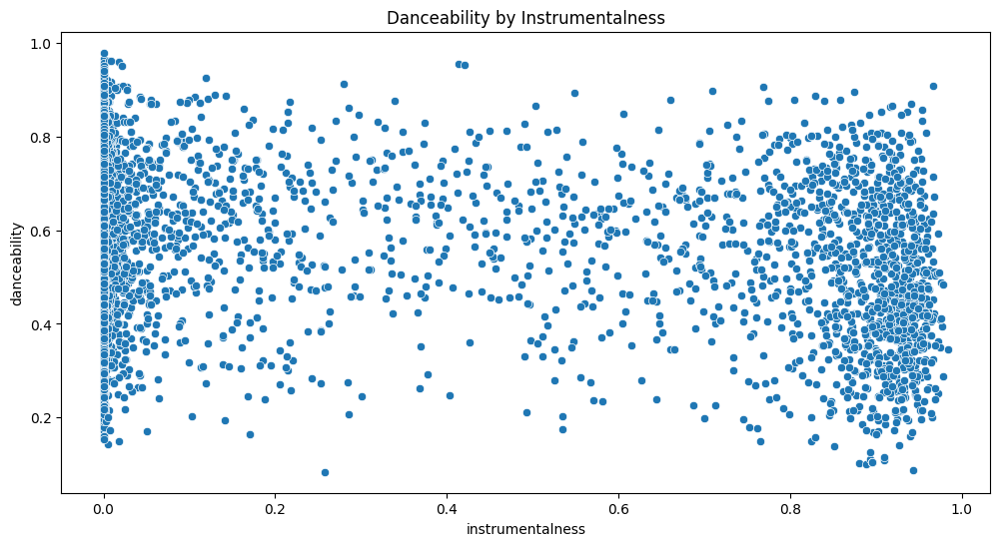

PearsonRResult(statistic=-0.19887296030813045, pvalue=1.7596716115193223e-105)


In [83]:
# danceability vs instrumentalness
plt.figure(figsize=(12,6))
sns.scatterplot(x='instrumentalness', y='danceability', data=data)
plt.title('Danceability by Instrumentalness')
plt.show()
corr = pearsonr(data['instrumentalness'], data['danceability'])
print(corr)

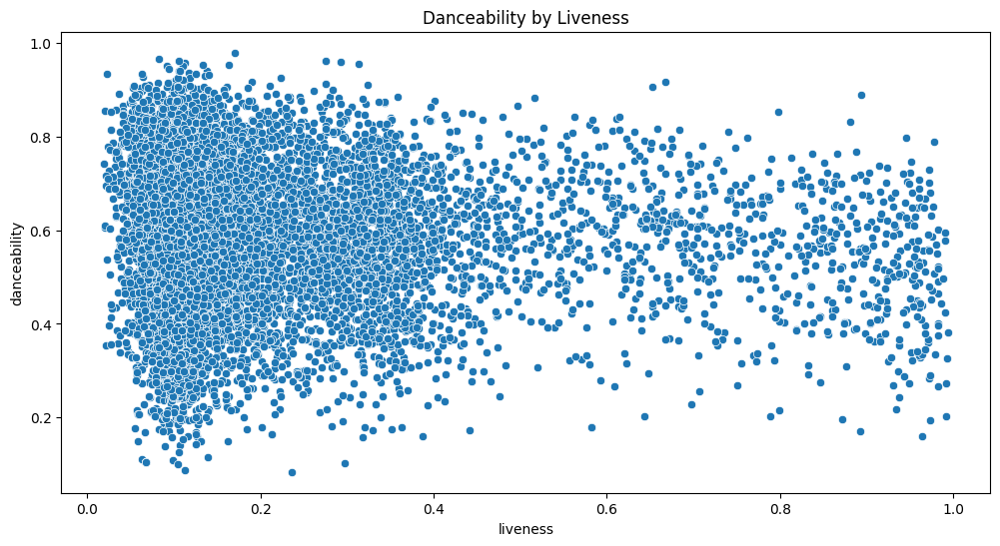

PearsonRResult(statistic=-0.07567738007738092, pvalue=1.8853095877481537e-16)


In [84]:
# Danceability vs liveness
plt.figure(figsize=(12,6))
sns.scatterplot(x='liveness', y='danceability', data=data)
plt.title('Danceability by Liveness')
plt.show()
corr = pearsonr(data['liveness'], data['danceability'])
print(corr)


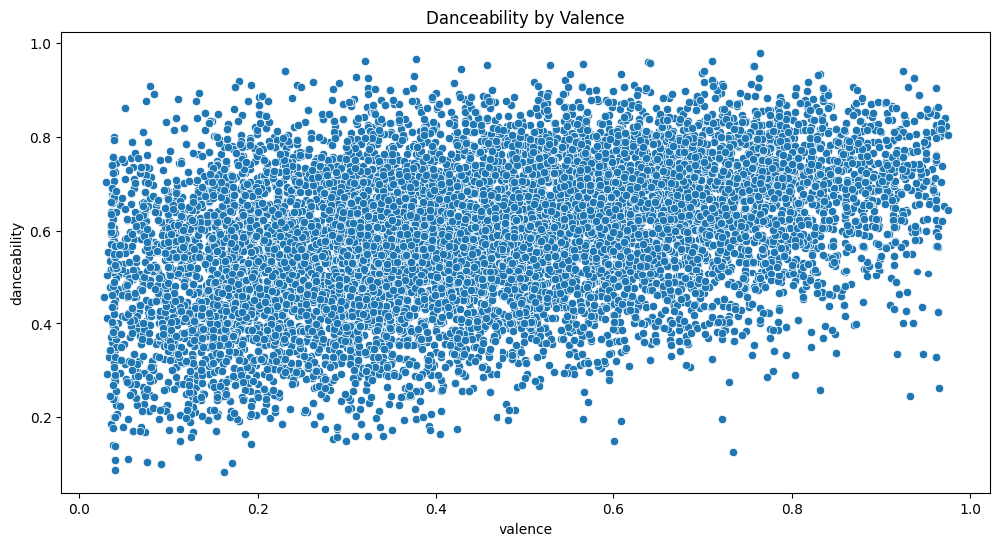

PearsonRResult(statistic=0.3712230145743306, pvalue=0.0)


In [85]:
# Danceability vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='danceability', data=data)
plt.title('Danceability by Valence')
plt.show()
corr = pearsonr(data['valence'], data['danceability'])
print(corr)

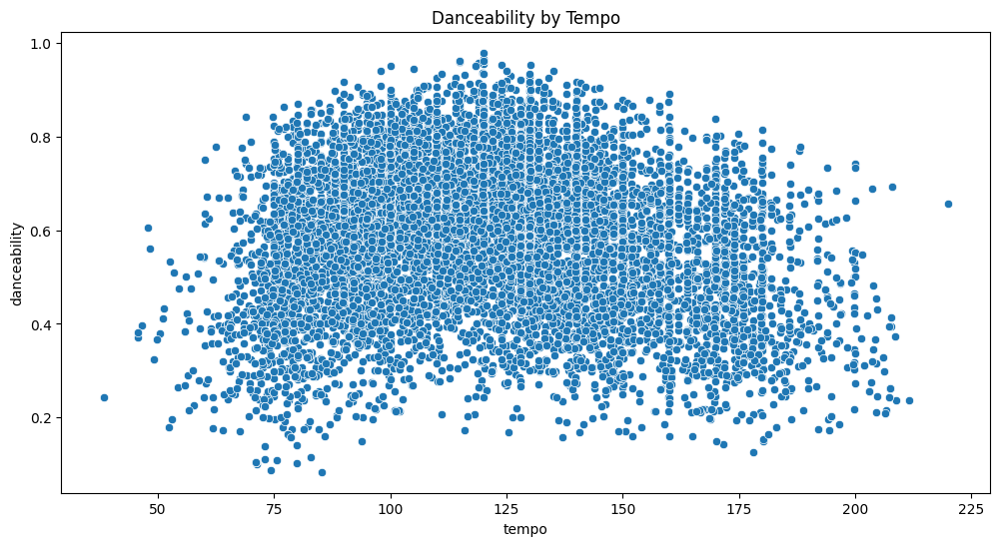

PearsonRResult(statistic=-0.10874448520194538, pvalue=2.3378612166406372e-32)


In [86]:
# Danceability vs tempo
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='danceability', data=data)
plt.title('Danceability by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['danceability'])
print(corr)

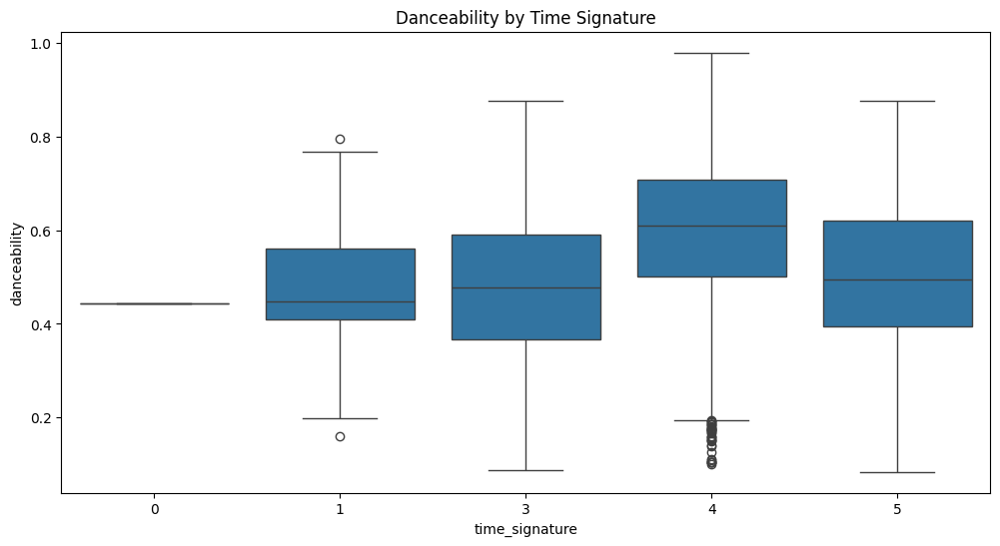

PearsonRResult(statistic=0.16978632768060103, pvalue=5.50907561821842e-77)


In [87]:
# Danceability vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='danceability', data=data)
plt.title('Danceability by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['danceability'])
print(corr)

<h1> Independant Vs Independant (Energy) </h1>

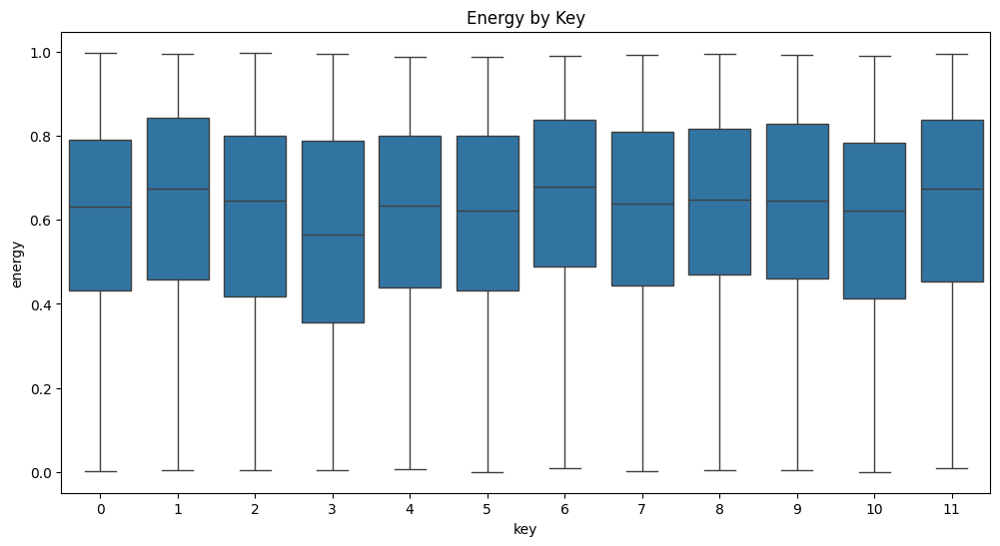

PearsonRResult(statistic=0.0209795580083544, pvalue=0.022708918127131942)


In [88]:
# Energy vs key
plt.figure(figsize=(12,6))
sns.boxplot(x='key', y='energy', data=data)
plt.title('Energy by Key')
plt.show()
corr = pearsonr(data['key'], data['energy'])
print(corr)

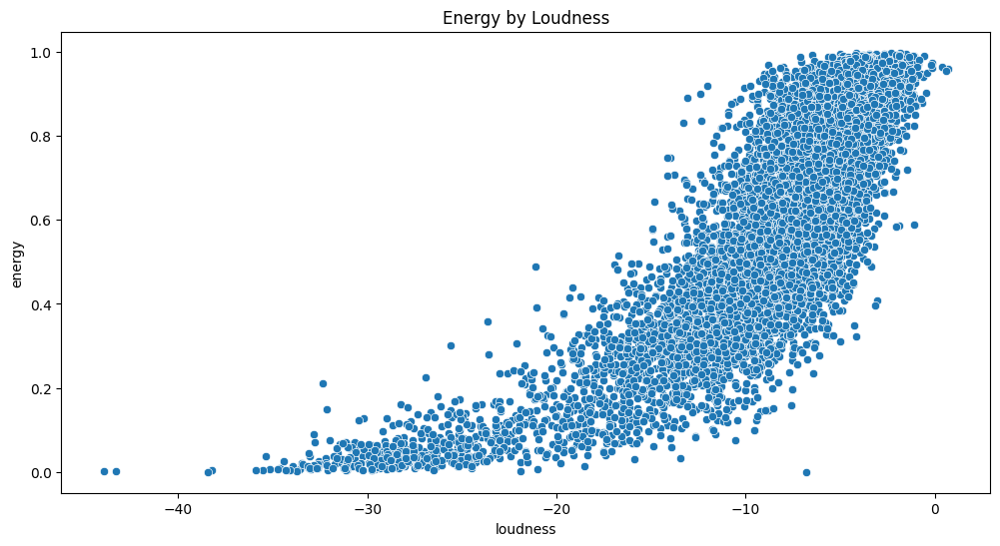

PearsonRResult(statistic=0.8143567506306809, pvalue=0.0)


In [89]:
# Energy vs loudness
plt.figure(figsize=(12,6))
sns.scatterplot(x='loudness', y='energy', data=data)
plt.title('Energy by Loudness')
plt.show()
corr = pearsonr(data['loudness'], data['energy'])
print(corr)

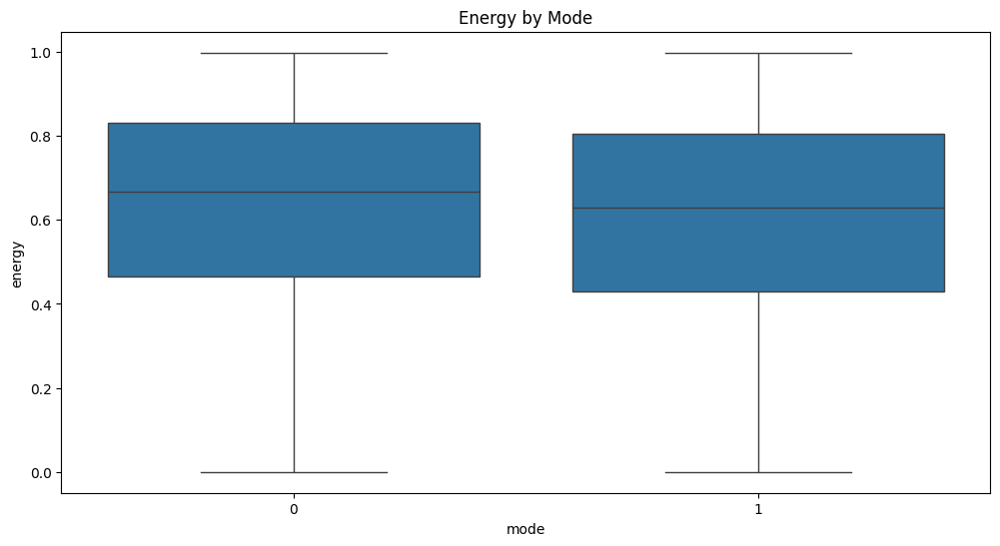

PearsonRResult(statistic=-0.0576340095885344, pvalue=3.7681401656847554e-10)


In [90]:
# Energy vs mode
plt.figure(figsize=(12,6))
sns.boxplot(x='mode', y='energy', data=data)
plt.title('Energy by Mode')
plt.show()
corr = pearsonr(data['mode'], data['energy'])
print(corr)

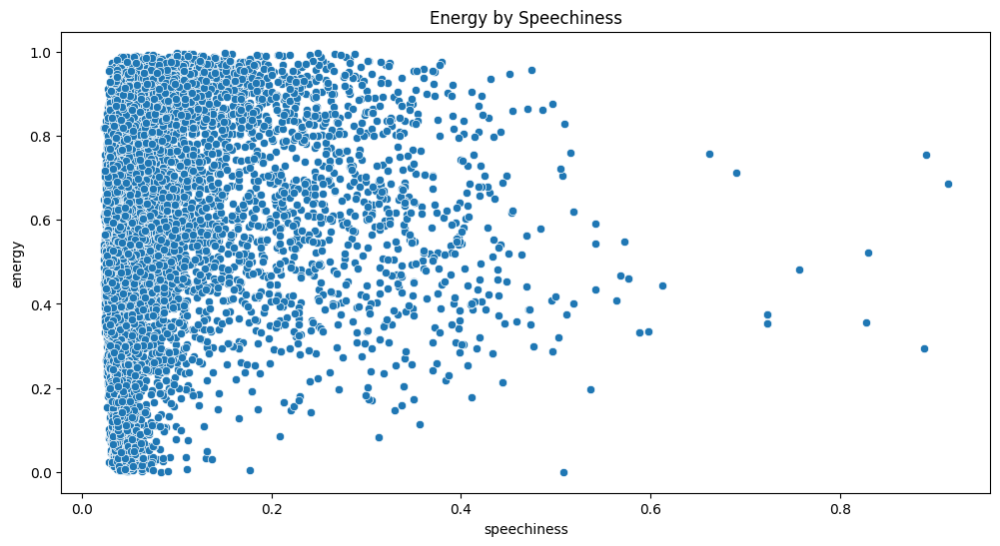

PearsonRResult(statistic=0.08589606352281617, pvalue=9.257172858326883e-21)


In [91]:
# Energy vs speechiness
plt.figure(figsize=(12,6))
sns.scatterplot(x='speechiness', y='energy', data=data)
plt.title('Energy by Speechiness')
plt.show()
corr = pearsonr(data['speechiness'], data['energy'])
print(corr)

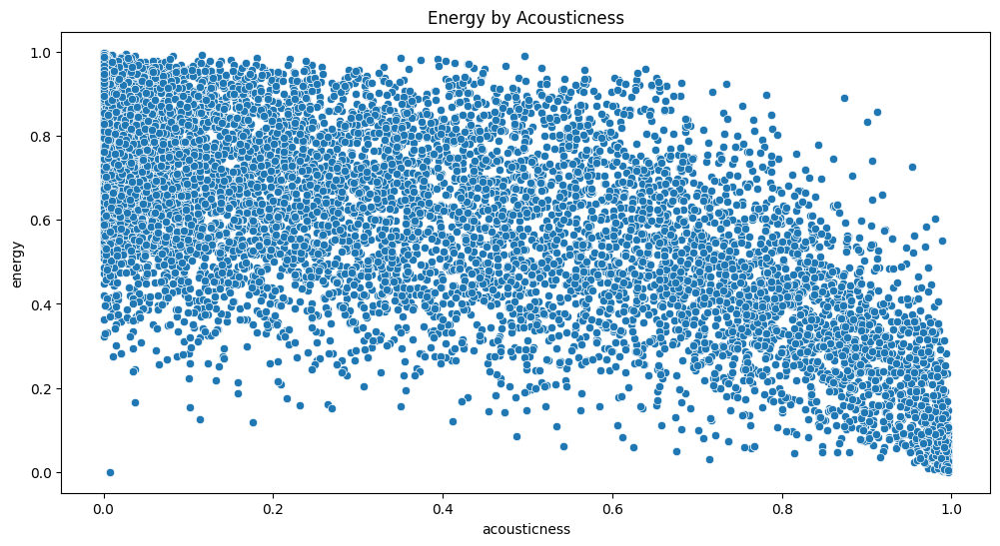

PearsonRResult(statistic=-0.739608730931318, pvalue=0.0)


In [92]:
# Energy vs acousticness
plt.figure(figsize=(12,6))
sns.scatterplot(x='acousticness', y='energy', data=data)
plt.title('Energy by Acousticness')
plt.show()
corr = pearsonr(data['acousticness'], data['energy'])
print(corr)

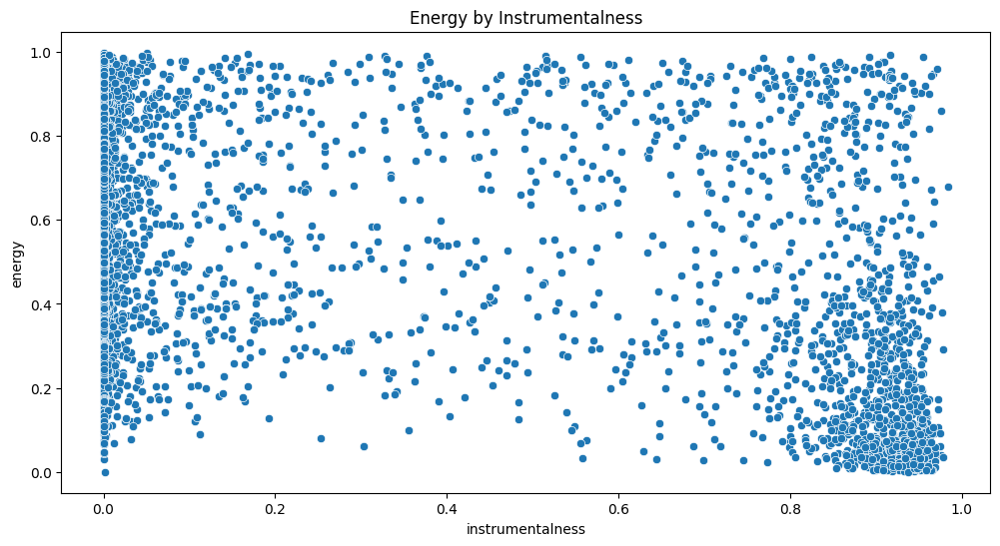

PearsonRResult(statistic=-0.4340385258500488, pvalue=0.0)


In [93]:
# Energy vs instrumentalness
plt.figure(figsize=(12,6))
sns.scatterplot(x='instrumentalness', y='energy', data=data)
plt.title('Energy by Instrumentalness')
plt.show()
corr = pearsonr(data['instrumentalness'], data['energy'])
print(corr)

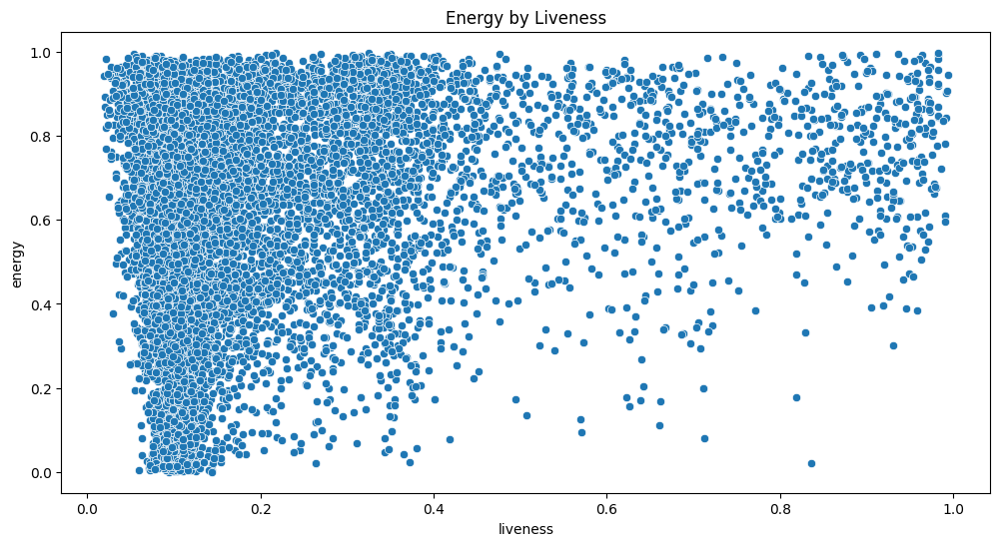

PearsonRResult(statistic=0.2189888440476926, pvalue=4.979238232182994e-128)


In [94]:
# Energy vs liveness
plt.figure(figsize=(12,6))
sns.scatterplot(x='liveness', y='energy', data=data)
plt.title('Energy by Liveness')
plt.show()
corr = pearsonr(data['liveness'], data['energy'])
print(corr)

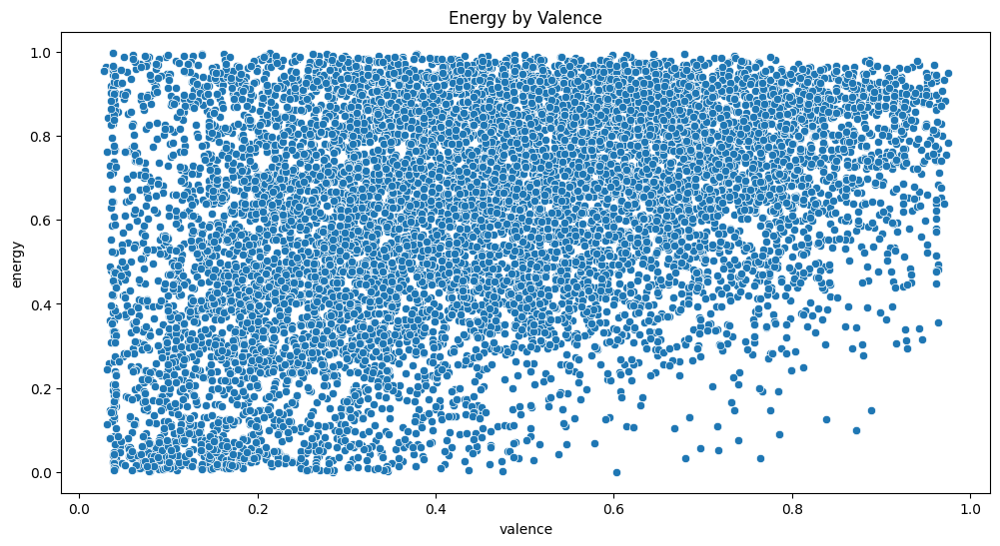

PearsonRResult(statistic=0.3658251425846466, pvalue=0.0)


In [95]:
# Energy vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='energy', data=data)
plt.title('Energy by Valence')
plt.show()
corr = pearsonr(data['valence'], data['energy'])
print(corr)

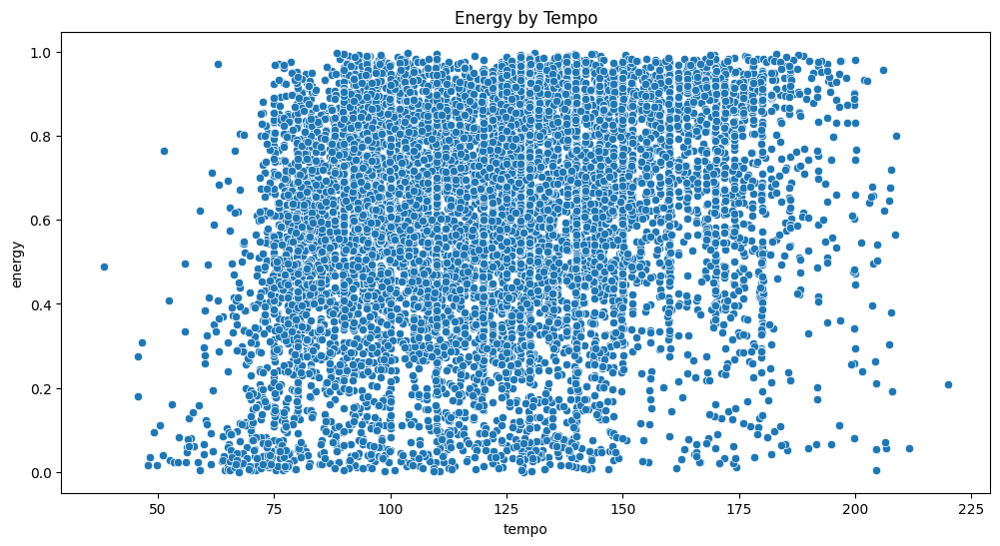

PearsonRResult(statistic=0.21366222374242497, pvalue=7.909129995547487e-122)


In [96]:
# Energy vs tempo
plt.figure(figsize=(12,6))  
sns.scatterplot(x='tempo', y='energy', data=data)
plt.title('Energy by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['energy'])
print(corr)

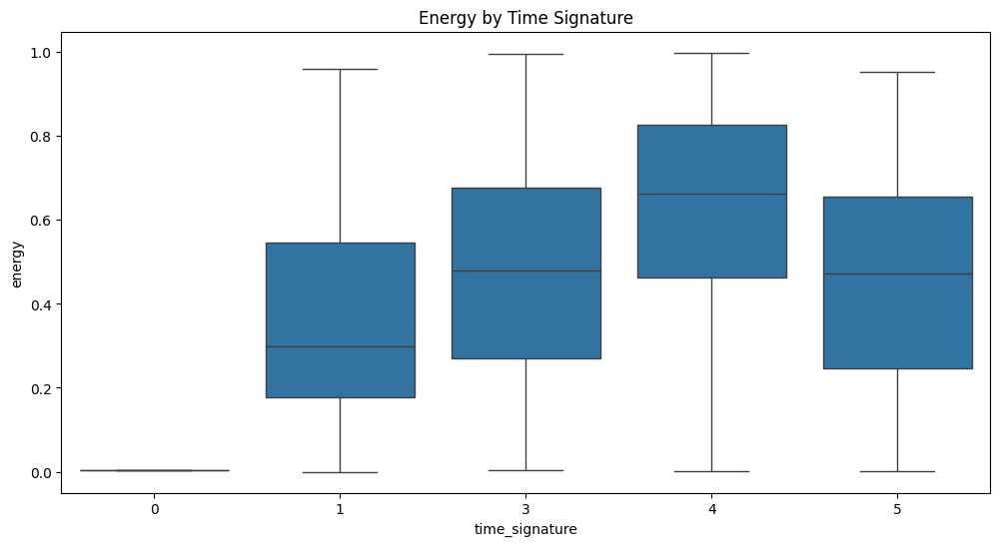

PearsonRResult(statistic=0.16311366434141927, pvalue=4.054849102475187e-71)


In [97]:
# Energy vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='energy', data=data)
plt.title('Energy by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['energy'])
print(corr)

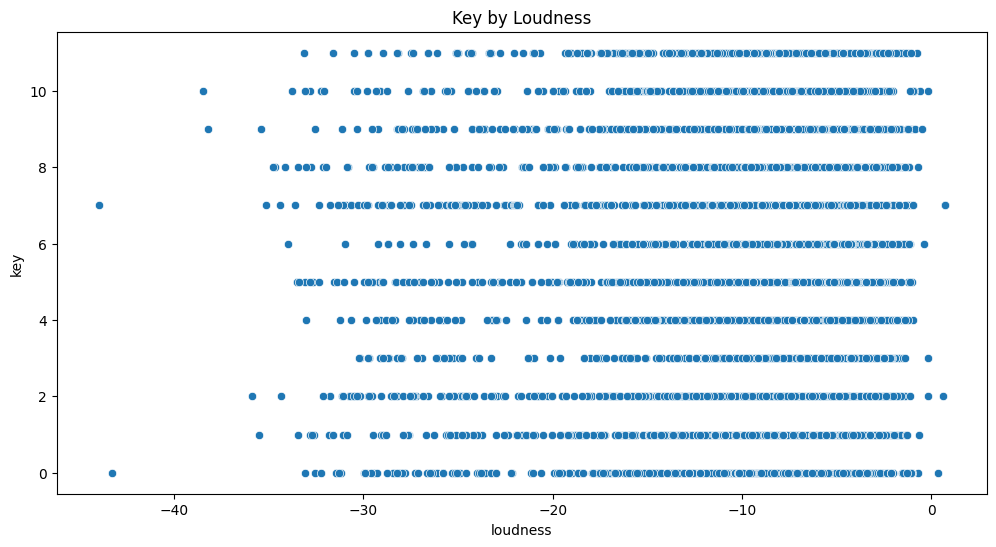

PearsonRResult(statistic=0.006144919820397529, pvalue=0.5046145684174428)


In [98]:
# Key vs loudness
plt.figure(figsize=(12,6))
sns.scatterplot(x='loudness', y='key', data=data)
plt.title('Key by Loudness')
plt.show()
corr = pearsonr(data['loudness'], data['key'])
print(corr)

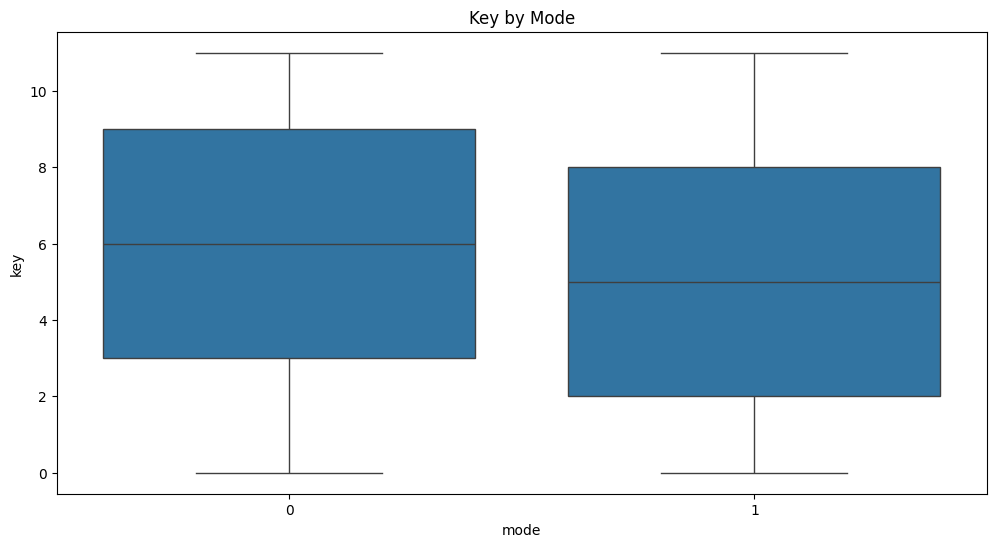

PearsonRResult(statistic=-0.09200034813623789, pvalue=1.3635567769941282e-23)


In [99]:
# Key vs mode
plt.figure(figsize=(12,6))
sns.boxplot(x='mode', y='key', data=data)
plt.title('Key by Mode')
plt.show()
corr = pearsonr(data['mode'], data['key'])
print(corr)

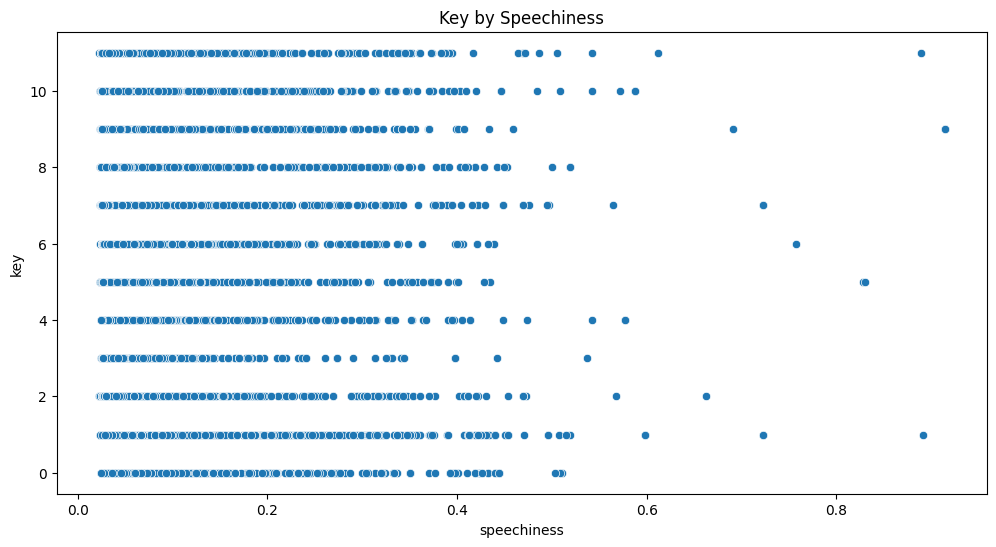

PearsonRResult(statistic=0.019454562405164716, pvalue=0.034630267535146954)


In [100]:
# Key vs speechiness
plt.figure(figsize=(12,6))
sns.scatterplot(x='speechiness', y='key', data=data)
plt.title('Key by Speechiness')
plt.show()
corr = pearsonr(data['speechiness'], data['key'])
print(corr)

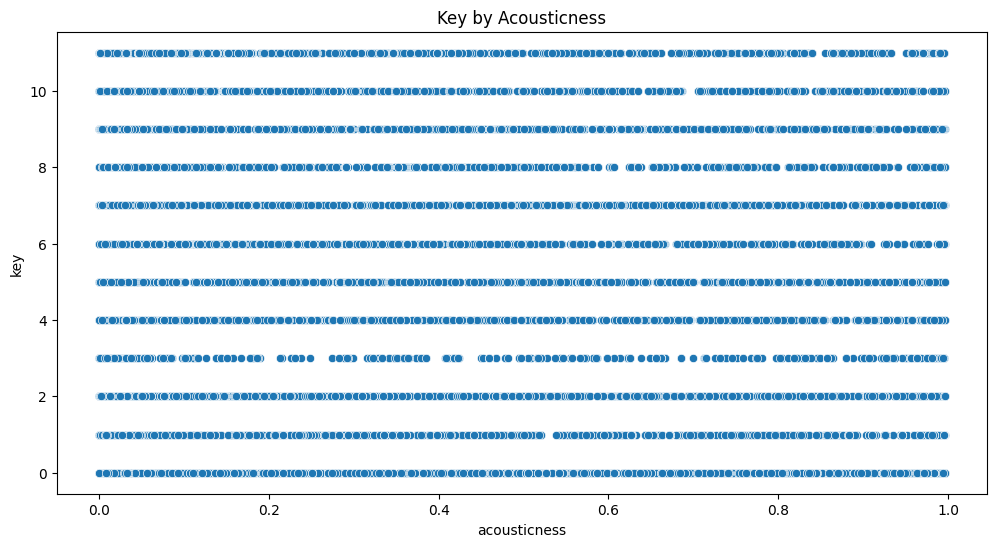

PearsonRResult(statistic=-0.010828655648849269, pvalue=0.23965323847762102)


In [101]:
# Key vs acousticness
plt.figure(figsize=(12,6))
sns.scatterplot(x='acousticness', y='key', data=data)
plt.title('Key by Acousticness')
plt.show()
corr = pearsonr(data['acousticness'], data['key'])
print(corr)

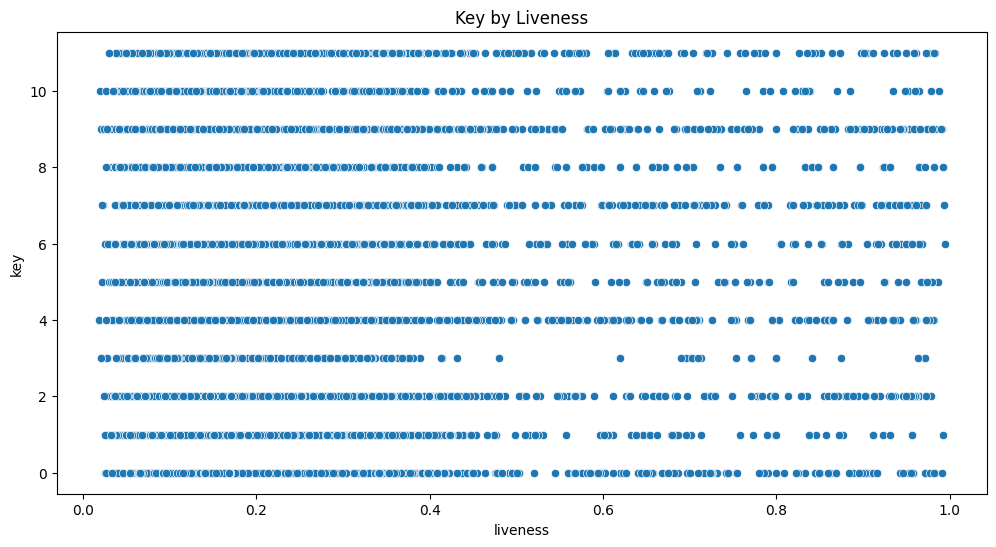

PearsonRResult(statistic=0.01219313133726125, pvalue=0.1854934046784469)


In [102]:
# key vs liveness 
plt.figure(figsize=(12,6))
sns.scatterplot(x='liveness', y='key', data=data)
plt.title('Key by Liveness')
plt.show()
corr = pearsonr(data['liveness'], data['key'])
print(corr)

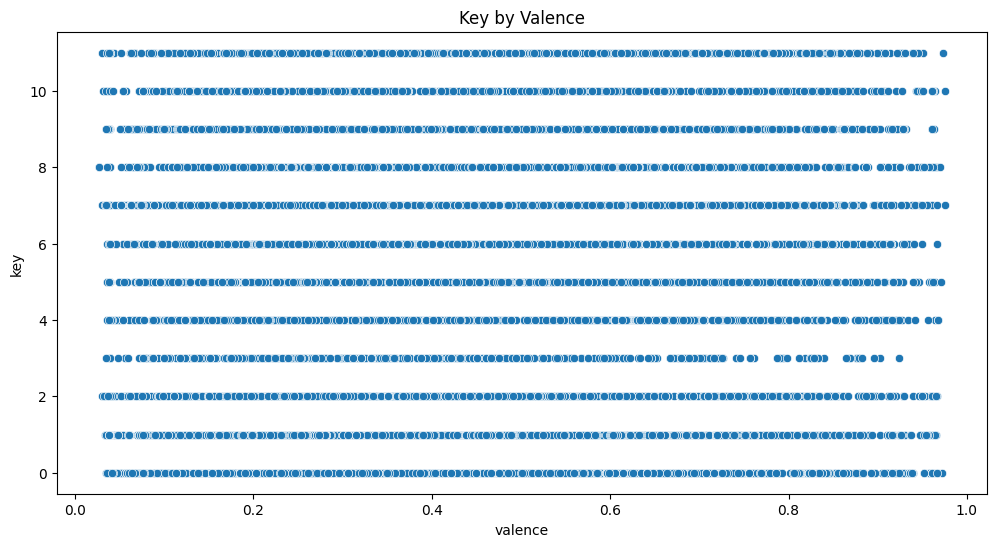

PearsonRResult(statistic=0.03954134134123238, pvalue=1.7450489593696673e-05)


In [103]:
# Key vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='key', data=data)
plt.title('Key by Valence')
plt.show()
corr = pearsonr(data['valence'], data['key'])
print(corr)

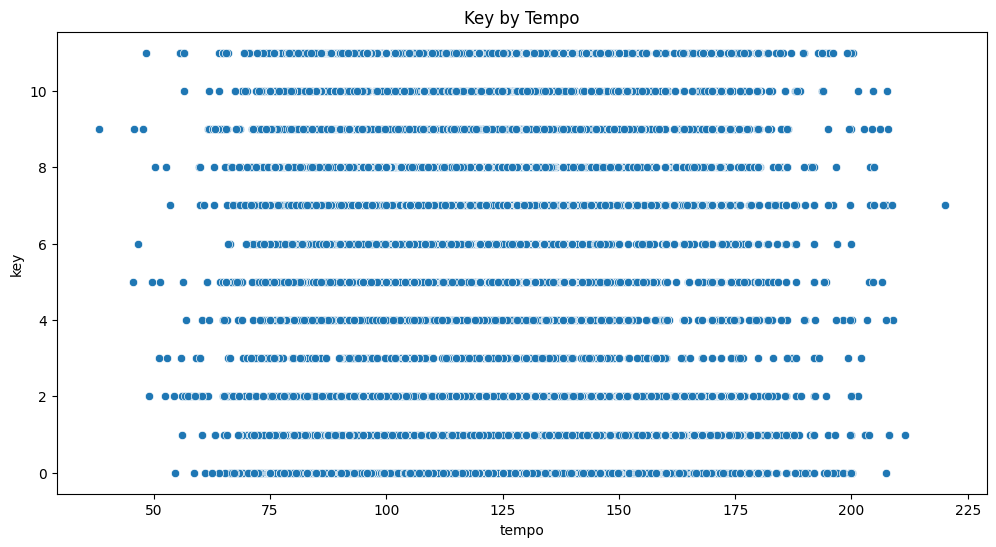

PearsonRResult(statistic=0.0007482691021995396, pvalue=0.9352430451450879)


In [104]:
# Key vs tempo
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='key', data=data)
plt.title('Key by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['key'])
print(corr)

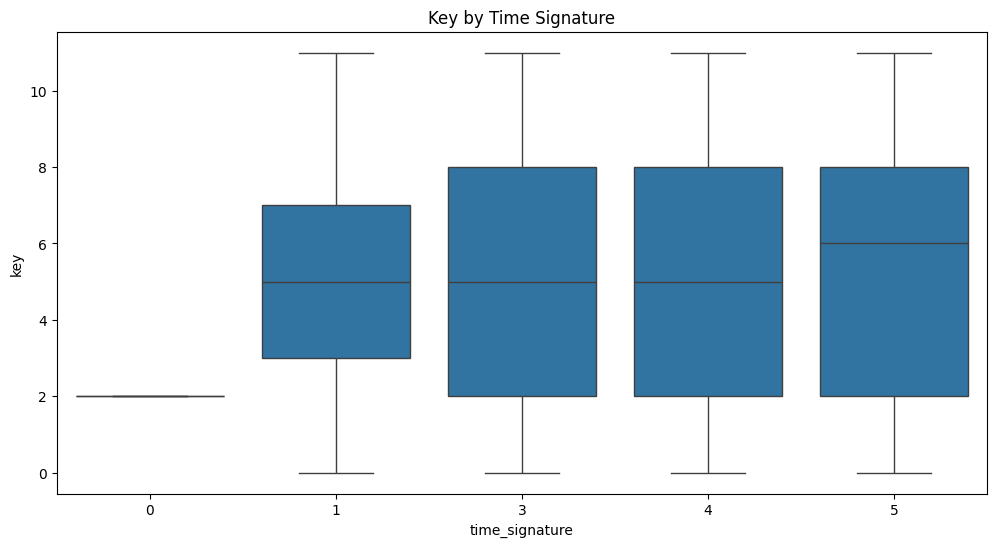

PearsonRResult(statistic=0.0035703198259504016, pvalue=0.6982520519594121)


In [105]:
# Key vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='key', data=data)
plt.title('Key by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['key'])
print(corr)

<h1> Independant Vs Independant (Loudness) </h1>

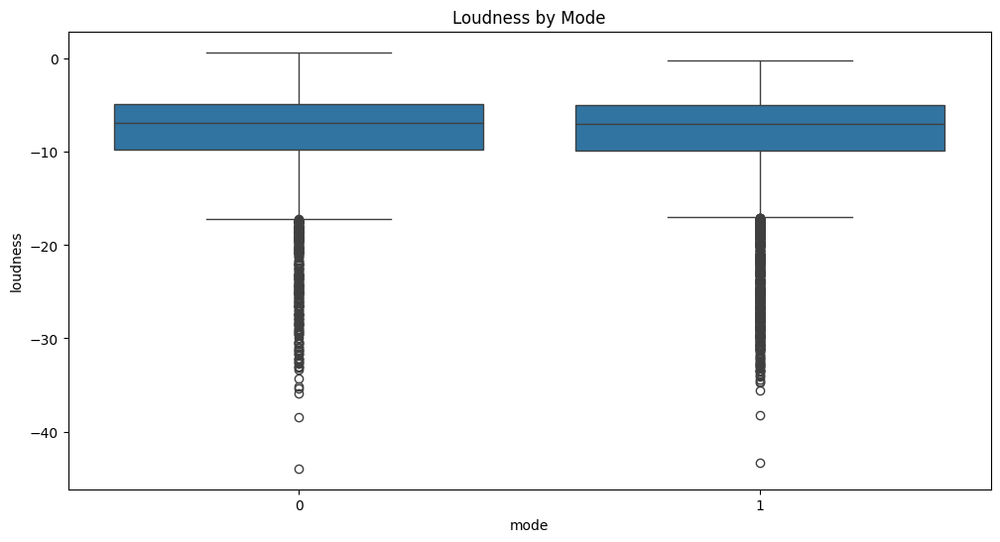

PearsonRResult(statistic=-0.019483138350159523, pvalue=0.03436528922109383)


In [106]:
# Loudness vs mode
plt.figure(figsize=(12,6))
sns.boxplot(x='mode', y='loudness', data=data)
plt.title('Loudness by Mode')
plt.show()
corr = pearsonr(data['mode'], data['loudness'])
print(corr)

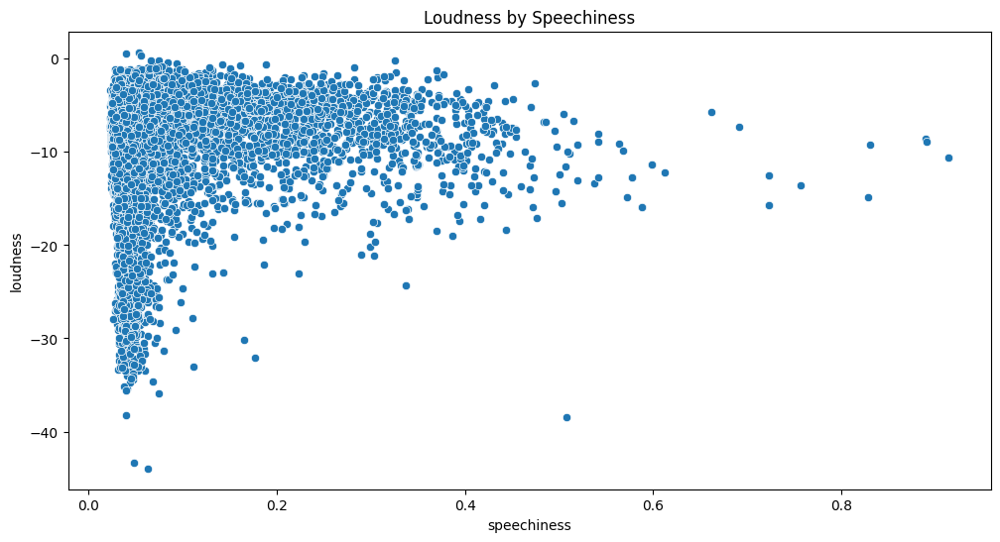

PearsonRResult(statistic=0.034808839681061784, pvalue=0.00015630567717111207)


In [107]:
# Loudness vs speechiness
plt.figure(figsize=(12,6))
sns.scatterplot(x='speechiness', y='loudness', data=data)
plt.title('Loudness by Speechiness')
plt.show()
corr = pearsonr(data['speechiness'], data['loudness'])
print(corr)


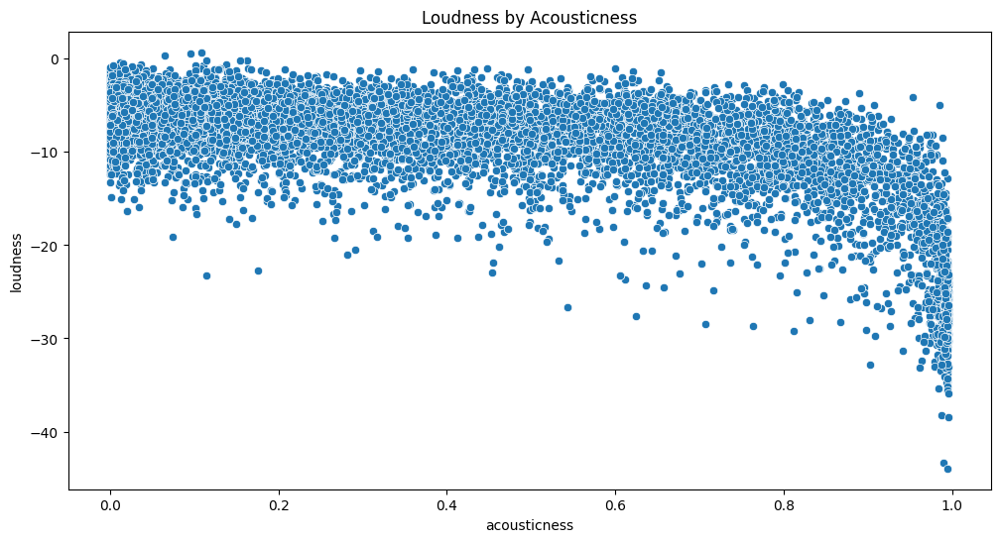

PearsonRResult(statistic=-0.6385051744314431, pvalue=0.0)


In [108]:
# Loudness vs acousticness
plt.figure(figsize=(12,6))
sns.scatterplot(x='acousticness', y='loudness', data=data)
plt.title('Loudness by Acousticness')
plt.show()
corr = pearsonr(data['acousticness'], data['loudness'])
print(corr)

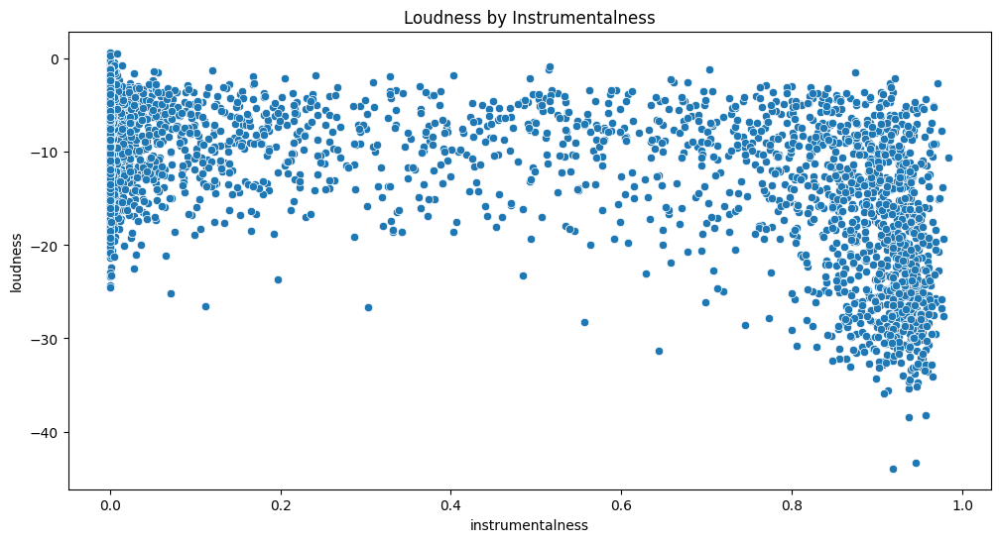

PearsonRResult(statistic=-0.6294484571345232, pvalue=0.0)


In [109]:
# Loudness vs instrumentalness
plt.figure(figsize=(12,6))
sns.scatterplot(x='instrumentalness', y='loudness', data=data)
plt.title('Loudness by Instrumentalness')
plt.show()
corr = pearsonr(data['instrumentalness'], data['loudness'])
print(corr)

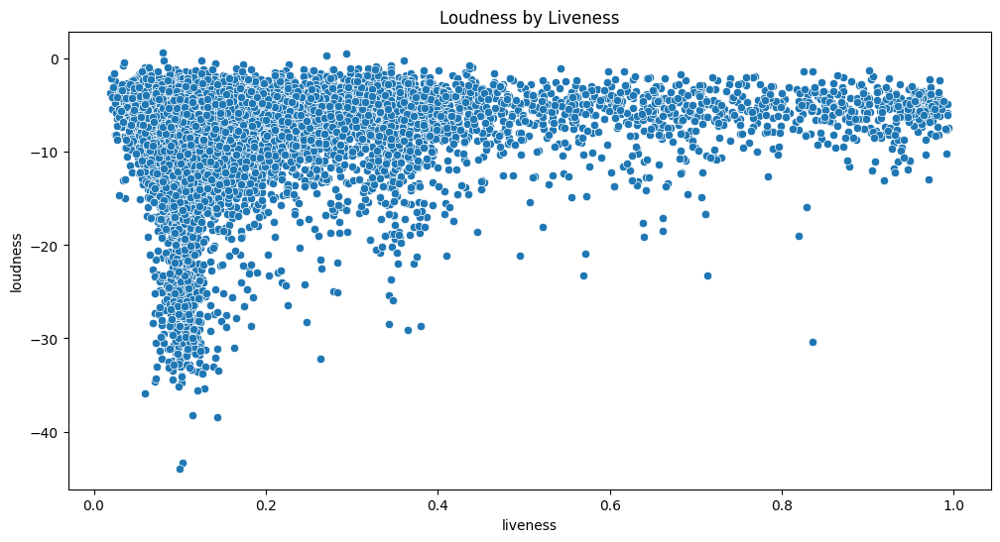

PearsonRResult(statistic=0.17471172596393797, pvalue=1.7841365387220474e-81)


In [110]:
# Loudness vs liveness 
plt.figure(figsize=(12,6))
sns.scatterplot(x='liveness', y='loudness', data=data)
plt.title('Loudness by Liveness')
plt.show()
corr = pearsonr(data['liveness'], data['loudness'])
print(corr)

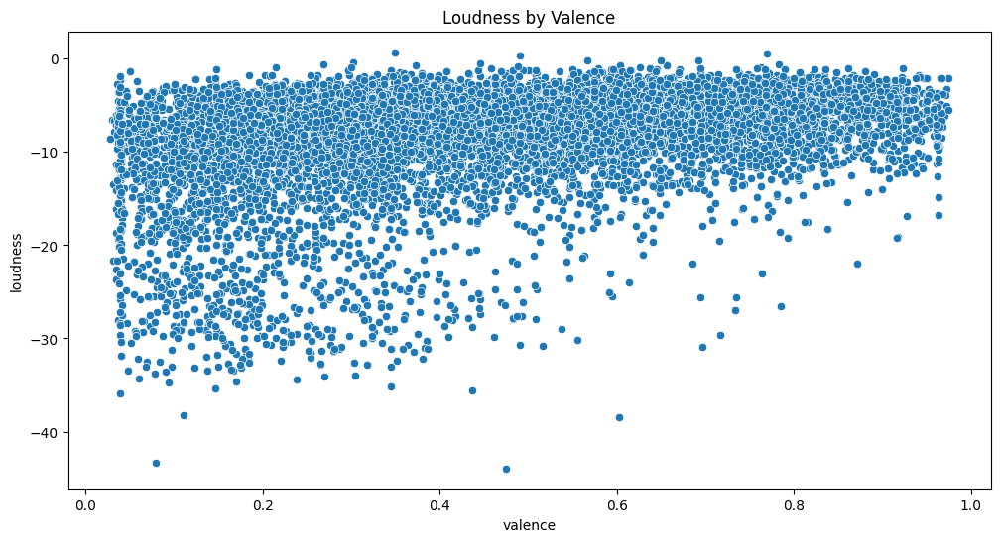

PearsonRResult(statistic=0.3340675052957151, pvalue=2.2938747699806396e-305)


In [111]:
# Loudness vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='loudness', data=data)
plt.title('Loudness by Valence')
plt.show()
corr = pearsonr(data['valence'], data['loudness'])
print(corr)

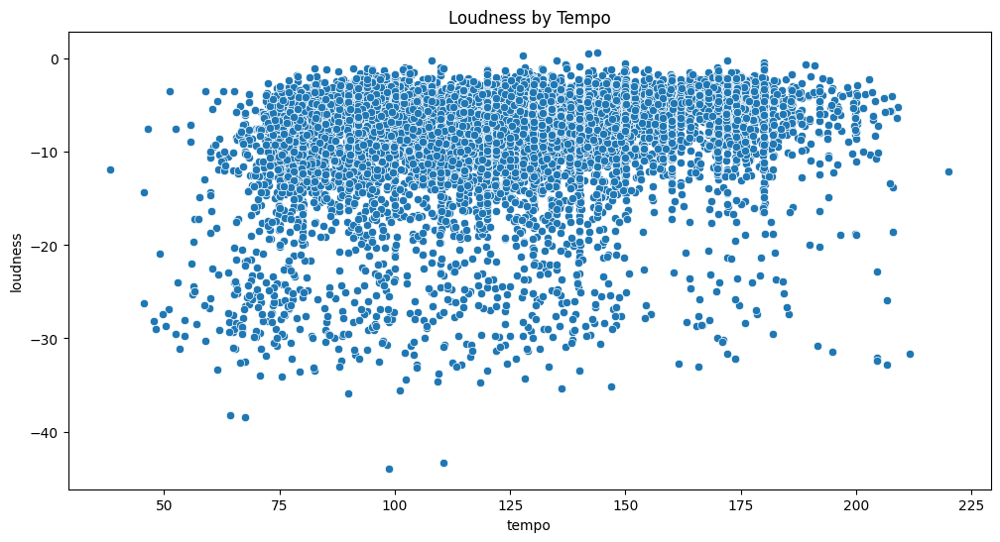

PearsonRResult(statistic=0.16271907831471577, pvalue=8.854853340215673e-71)


In [112]:
# Loudness vs tempo
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='loudness', data=data)
plt.title('Loudness by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['loudness'])
print(corr)

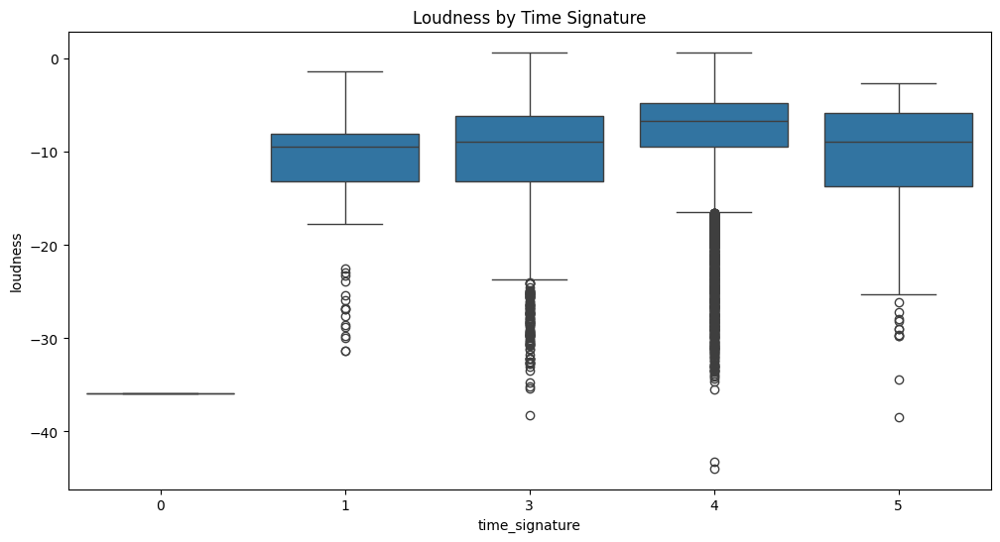

PearsonRResult(statistic=0.1444765994786148, pvalue=4.952831010710086e-56)


In [113]:
# Loudness vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='loudness', data=data)
plt.title('Loudness by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['loudness'])
print(corr)

<h1> Independant Vs Independant (Speechiness) </h1>

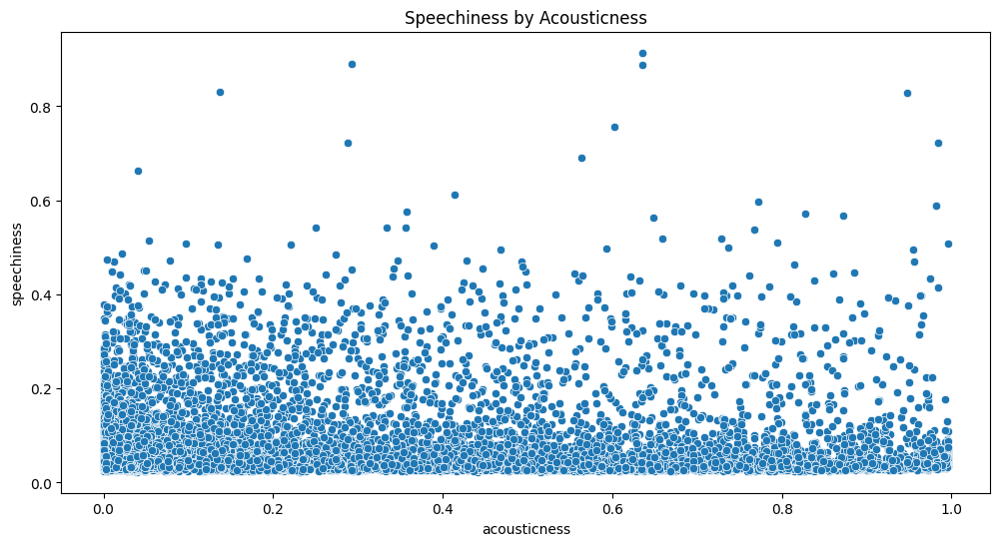

PearsonRResult(statistic=-0.05446325068769639, pvalue=3.254169058466776e-09)


In [114]:
# speechiness vs acousticness
plt.figure(figsize=(12,6))
sns.scatterplot(x='acousticness', y='speechiness', data=data)
plt.title('Speechiness by Acousticness')
plt.show()
corr = pearsonr(data['acousticness'], data['speechiness'])
print(corr)

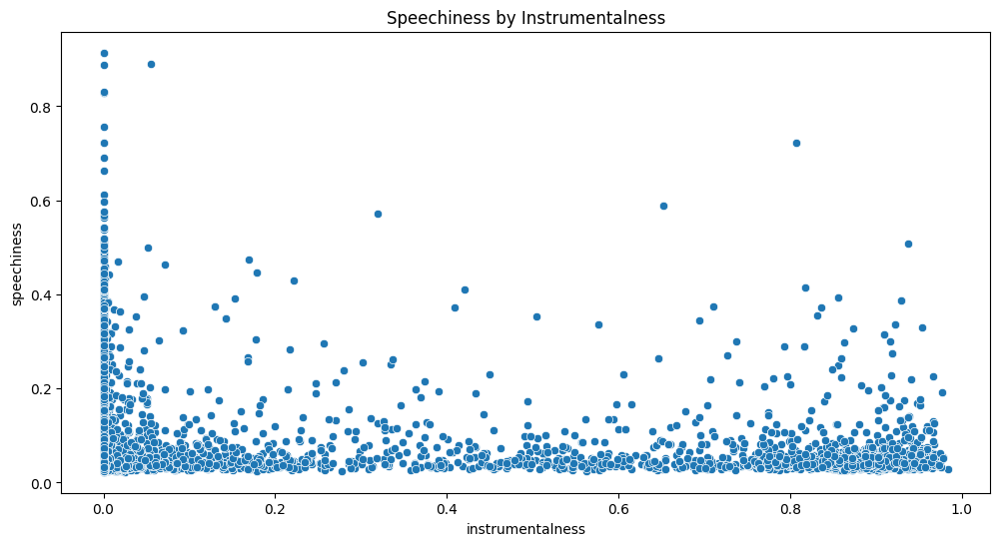

PearsonRResult(statistic=-0.09180331489386694, pvalue=1.6947346550537314e-23)


In [115]:
# Speechiness vs instrumentalness
plt.figure(figsize=(12,6))
sns.scatterplot(x='instrumentalness', y='speechiness', data=data)
plt.title('Speechiness by Instrumentalness')
plt.show()
corr = pearsonr(data['instrumentalness'], data['speechiness'])
print(corr)

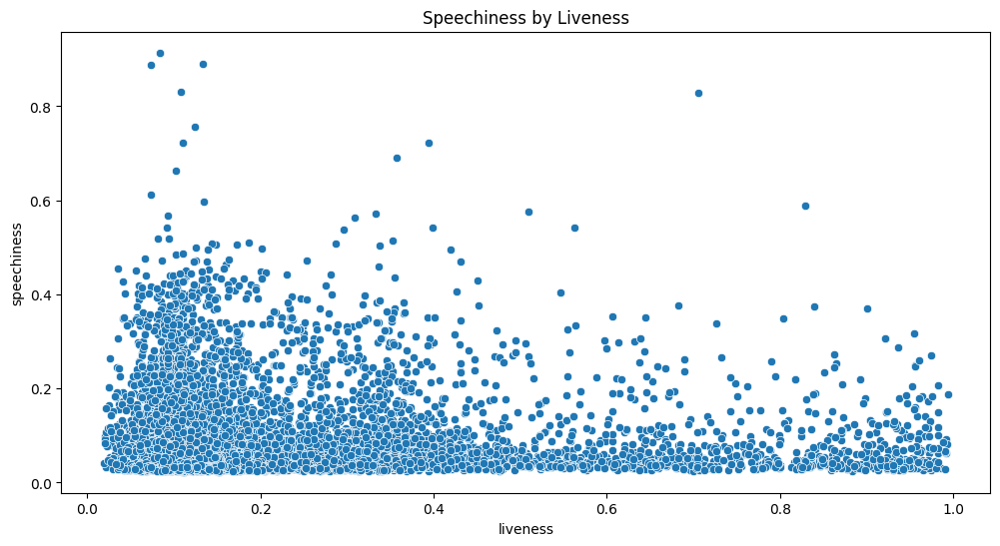

PearsonRResult(statistic=0.032975722495575274, pvalue=0.0003414805591228578)


In [116]:
# Speechiness vs liveness
plt.figure(figsize=(12,6))
sns.scatterplot(x='liveness', y='speechiness', data=data)
plt.title('Speechiness by Liveness')
plt.show()
corr = pearsonr(data['liveness'], data['speechiness'])
print(corr)

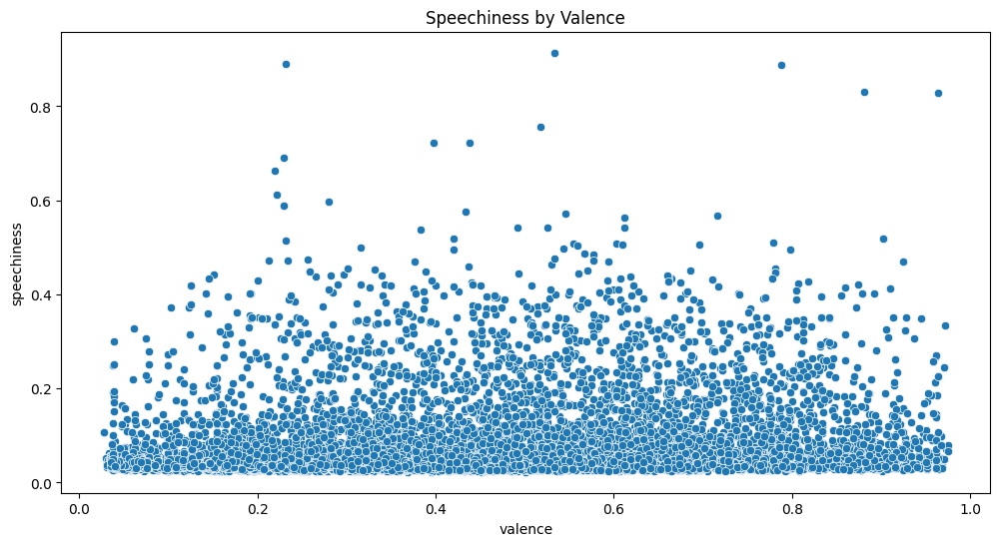

PearsonRResult(statistic=0.12946608517904876, pvalue=2.967234471417211e-45)


In [117]:
# Speechiness vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='speechiness', data=data)
plt.title('Speechiness by Valence')
plt.show()
corr = pearsonr(data['valence'], data['speechiness'])
print(corr)

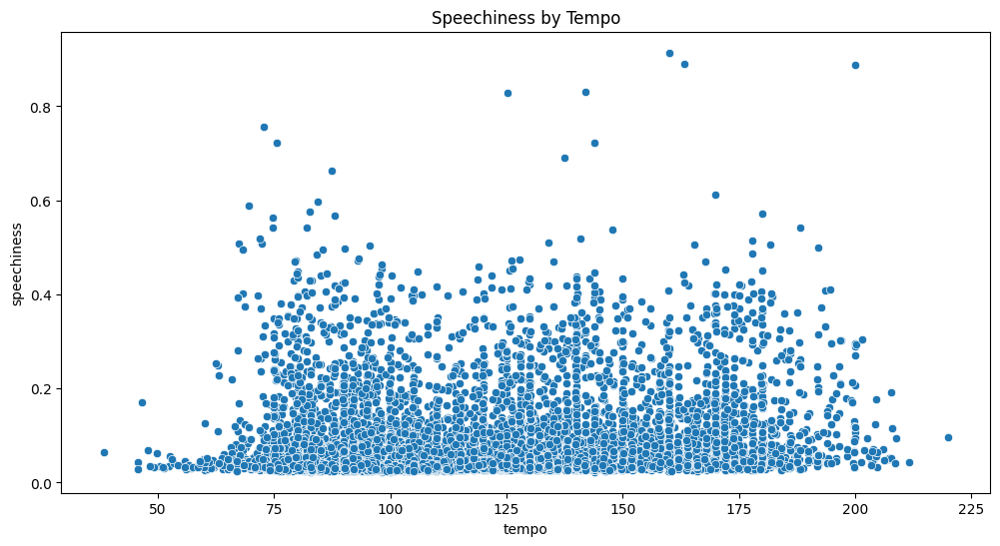

PearsonRResult(statistic=0.09809200466485282, pvalue=1.3043910191776246e-26)


In [118]:
# Speechiness vs tempo 
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='speechiness', data=data)
plt.title('Speechiness by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['speechiness'])
print(corr)

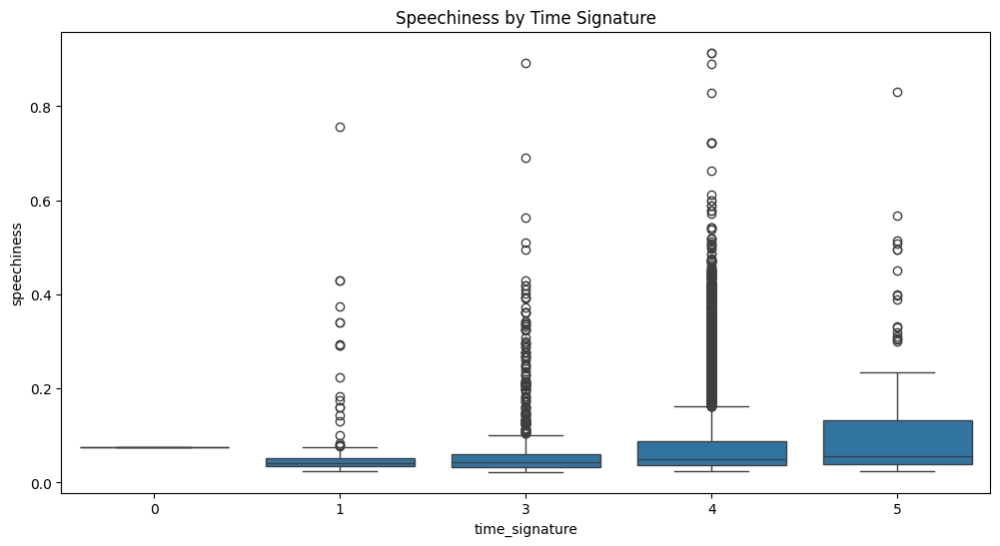

PearsonRResult(statistic=0.03700449942404932, pvalue=5.832780361571685e-05)


In [119]:
# Speechiness vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='speechiness', data=data)
plt.title('Speechiness by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['speechiness'])
print(corr)

<h1> Independant Vs Independant (Accousticness) </h1>

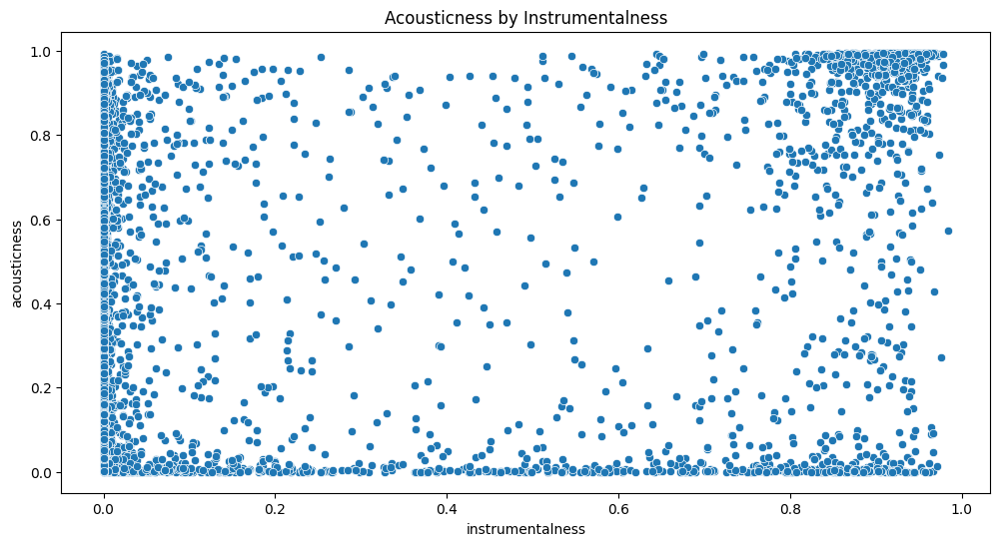

PearsonRResult(statistic=0.354067627081662, pvalue=0.0)


In [120]:
# Acousticness vs instrumentalness
plt.figure(figsize=(12,6))
sns.scatterplot(x='instrumentalness', y='acousticness', data=data)
plt.title('Acousticness by Instrumentalness')
plt.show()
corr = pearsonr(data['instrumentalness'], data['acousticness'])
print(corr)

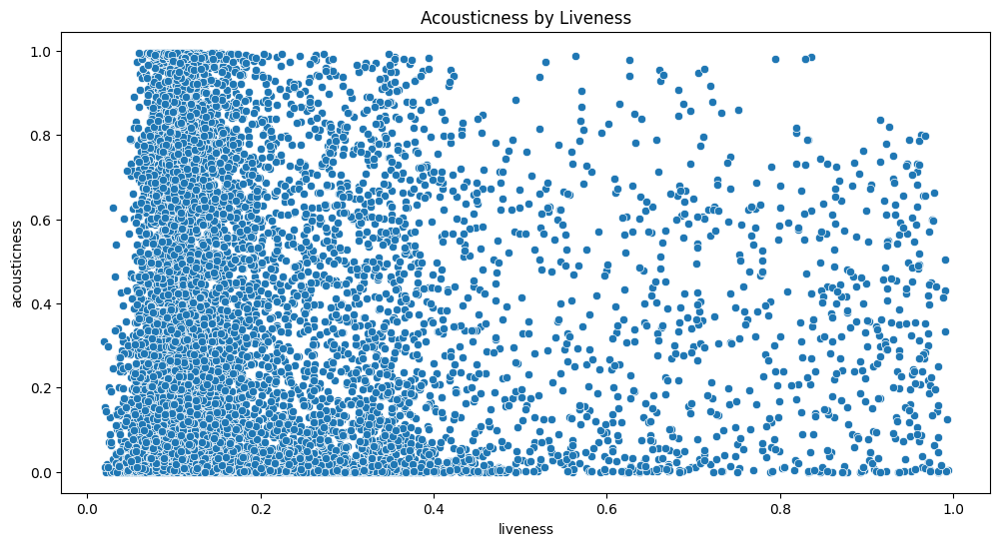

PearsonRResult(statistic=-0.07840020617006925, pvalue=1.5131379385517898e-17)


In [121]:
# Acousticness vs liveness
plt.figure(figsize=(12,6))
sns.scatterplot(x='liveness', y='acousticness', data=data)
plt.title('Acousticness by Liveness')
plt.show()
corr = pearsonr(data['liveness'], data['acousticness'])
print(corr)

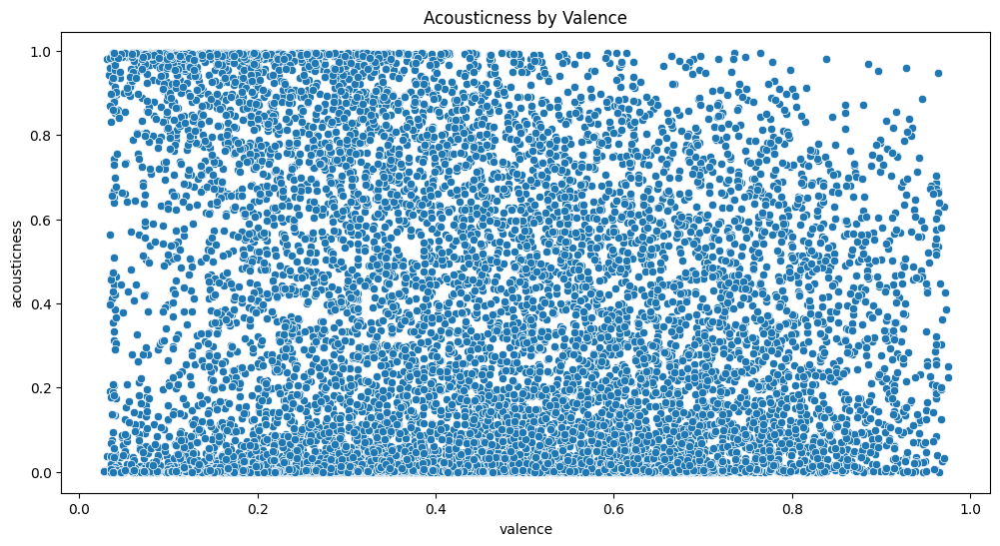

PearsonRResult(statistic=-0.1674364871981563, pvalue=6.8448857515265e-75)


In [122]:
# Acousticness vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='acousticness', data=data)
plt.title('Acousticness by Valence')
plt.show()
corr = pearsonr(data['valence'], data['acousticness'])
print(corr)

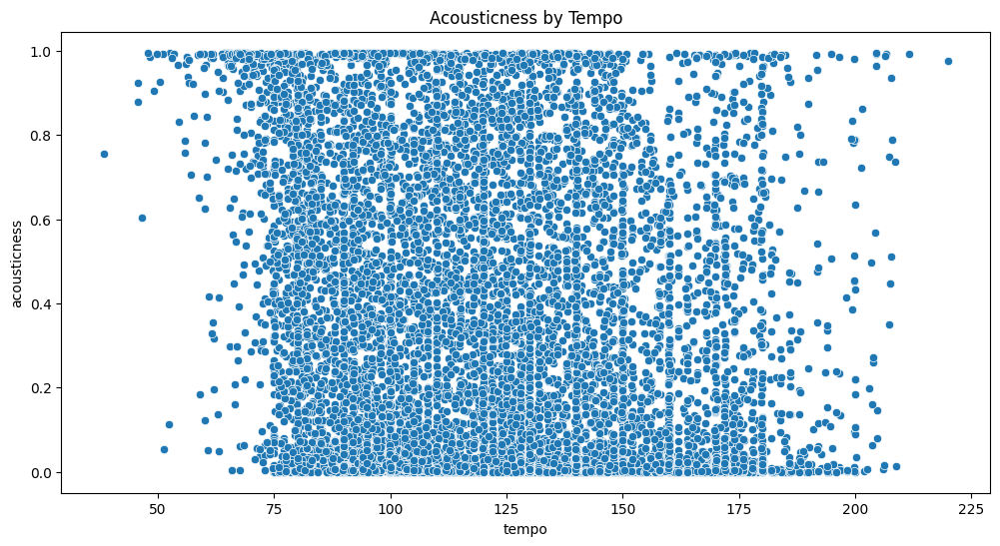

PearsonRResult(statistic=-0.18542109980478644, pvalue=1.0462102165967083e-91)


In [123]:
# Acousticness vs tempo
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='acousticness', data=data)
plt.title('Acousticness by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['acousticness'])
print(corr)

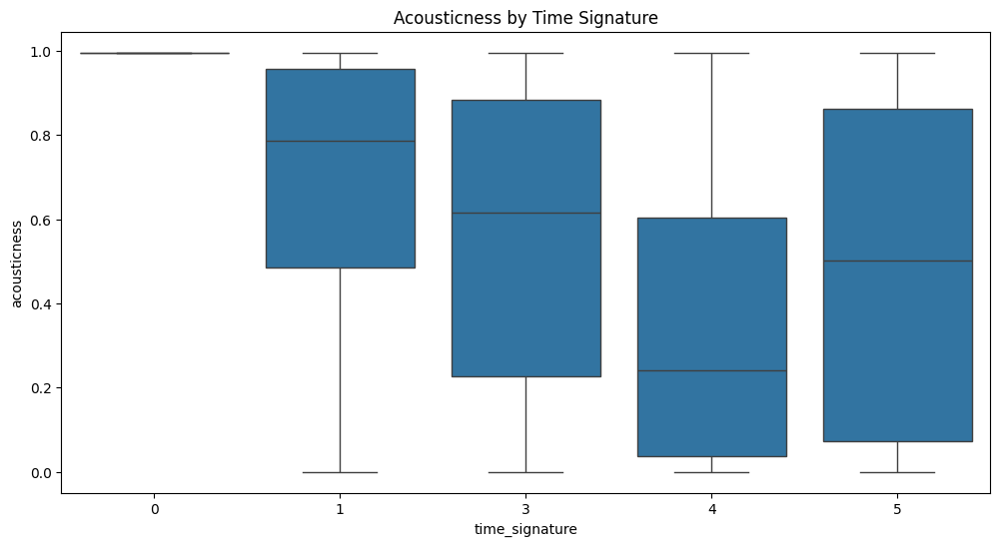

PearsonRResult(statistic=-0.17171076729491347, pvalue=1.0069767153647153e-78)


In [124]:
# Acousticness vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='acousticness', data=data)
plt.title('Acousticness by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['acousticness'])
print(corr)

<h1> Independant Vs Independant (Instrumental) </h1>

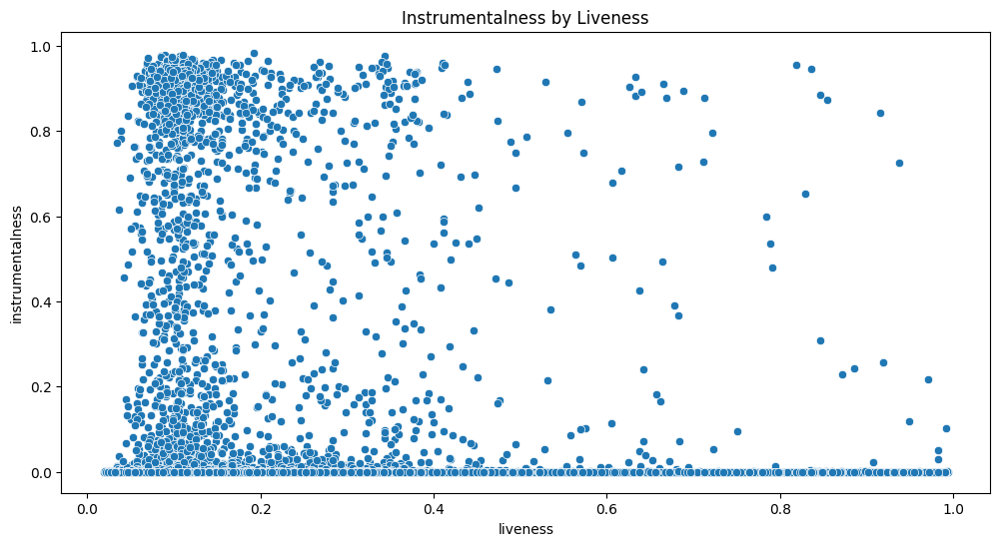

PearsonRResult(statistic=-0.11043824340018558, pvalue=2.5125774535179366e-33)


In [125]:
# Instrumentalness vs liveness 
plt.figure(figsize=(12,6))
sns.scatterplot(x='liveness', y='instrumentalness', data=data)
plt.title('Instrumentalness by Liveness')
plt.show()
corr = pearsonr(data['liveness'], data['instrumentalness'])
print(corr)

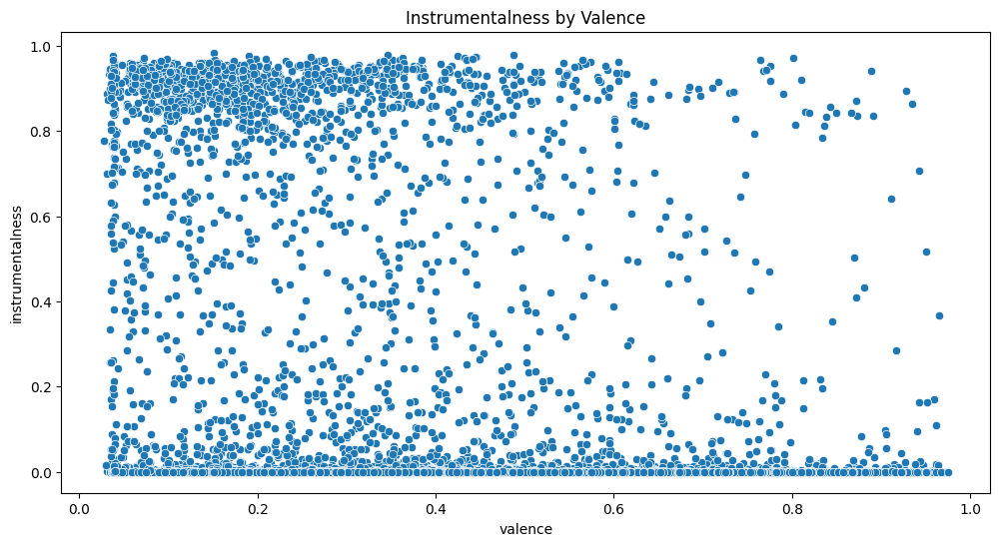

PearsonRResult(statistic=-0.3538790748843602, pvalue=0.0)


In [126]:
# Instrumentalness vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='instrumentalness', data=data)
plt.title('Instrumentalness by Valence')
plt.show()
corr = pearsonr(data['valence'], data['instrumentalness'])
print(corr)

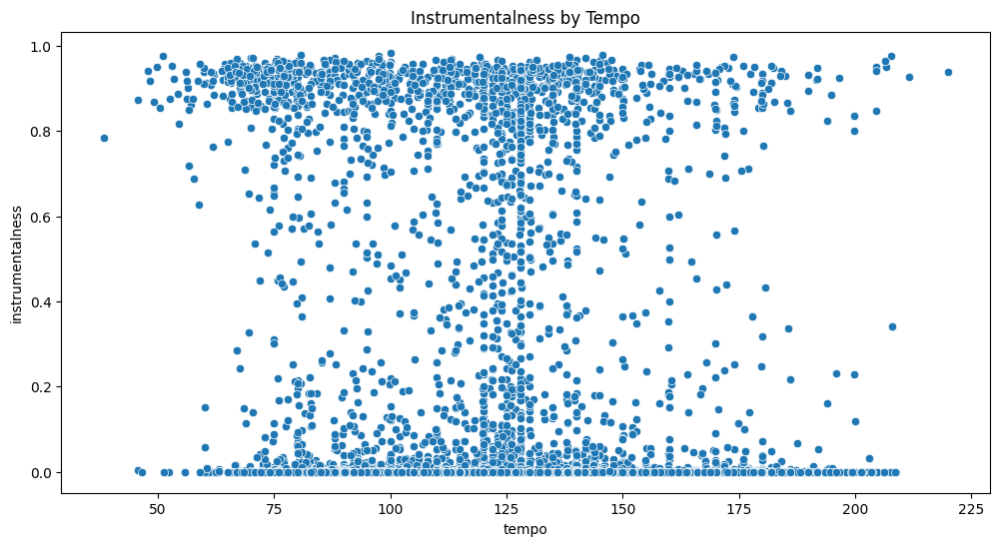

PearsonRResult(statistic=-0.08742913530918779, pvalue=1.877008744762057e-21)


In [127]:
# Instrumentalness vs tempo
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='instrumentalness', data=data)
plt.title('Instrumentalness by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['instrumentalness'])
print(corr)

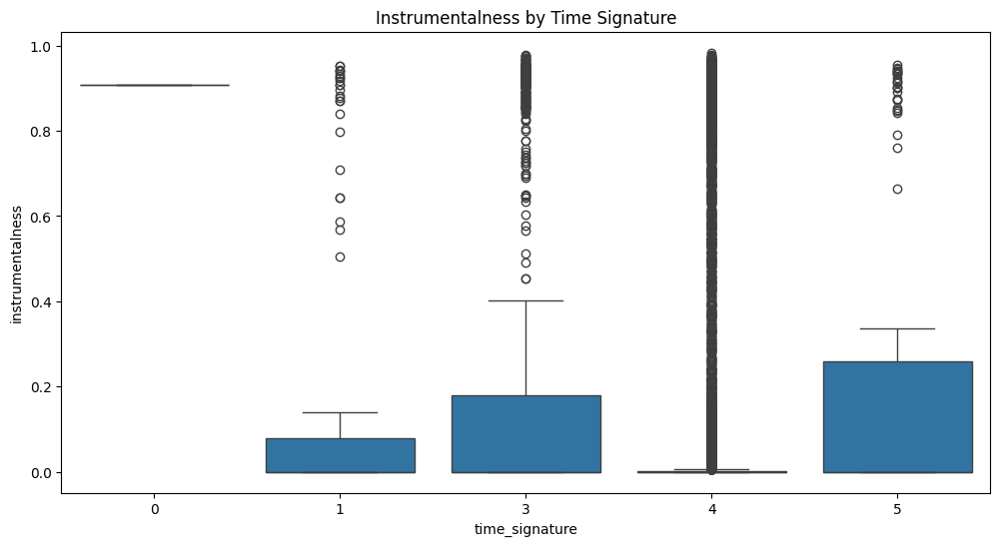

PearsonRResult(statistic=-0.07512277654398668, pvalue=3.1178014048658847e-16)


In [128]:
# Instrumentalness vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='instrumentalness', data=data)
plt.title('Instrumentalness by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['instrumentalness'])
print(corr)

<h1> Independant Vs Independant (Liveness) </h1>

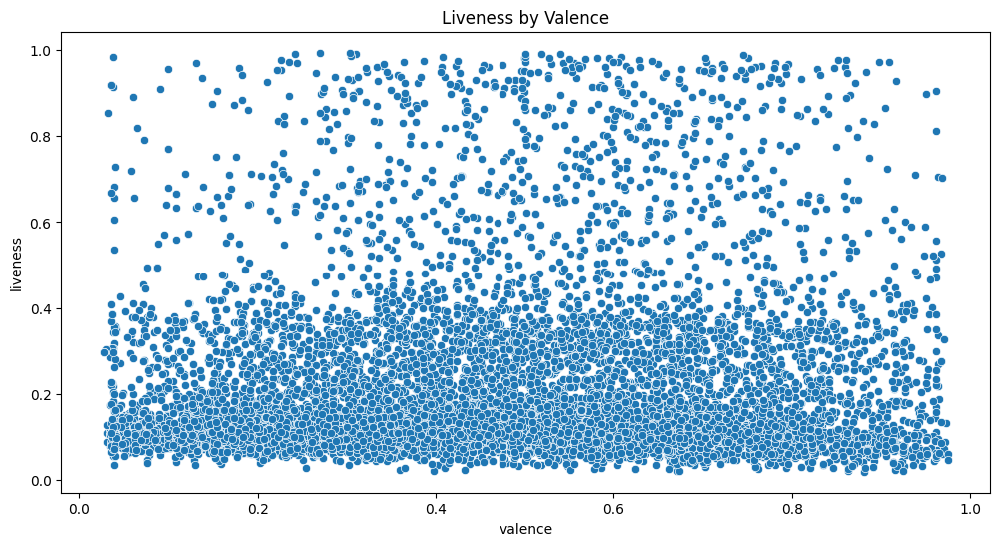

PearsonRResult(statistic=0.11098495058528551, pvalue=1.2139859889536396e-33)


In [129]:
# Liveness vs valence
plt.figure(figsize=(12,6))
sns.scatterplot(x='valence', y='liveness', data=data)
plt.title('Liveness by Valence')
plt.show()
corr = pearsonr(data['valence'], data['liveness'])
print(corr)

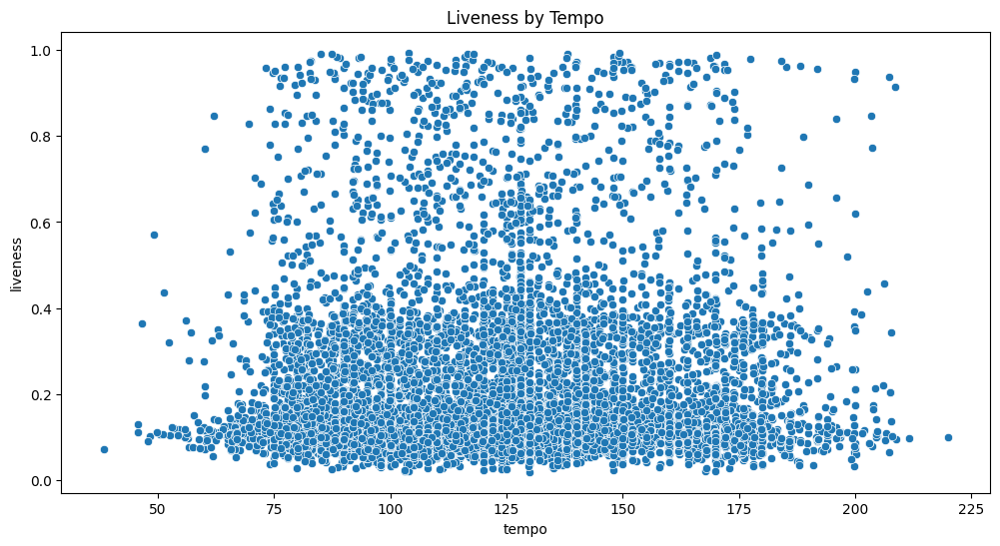

PearsonRResult(statistic=0.04860689460780625, pvalue=1.284415187741263e-07)


In [130]:
# Liveness vs tempo
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='liveness', data=data)
plt.title('Liveness by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['liveness'])
print(corr)

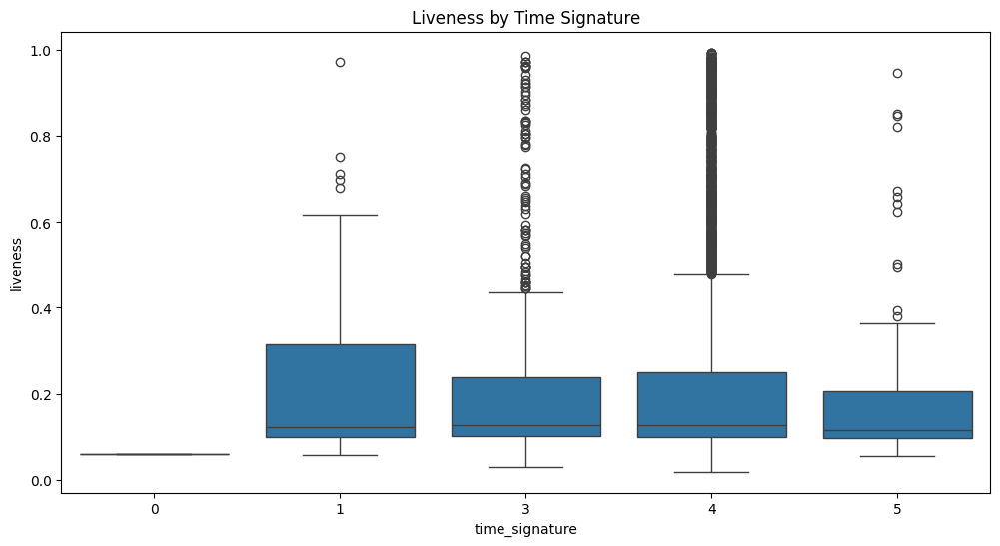

PearsonRResult(statistic=-0.0035825332101018905, pvalue=0.697270760334503)


In [131]:
# Liveness vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='liveness', data=data)
plt.title('Liveness by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['liveness'])
print(corr)

<h1> Independant Vs Independant (Valence) </h1>

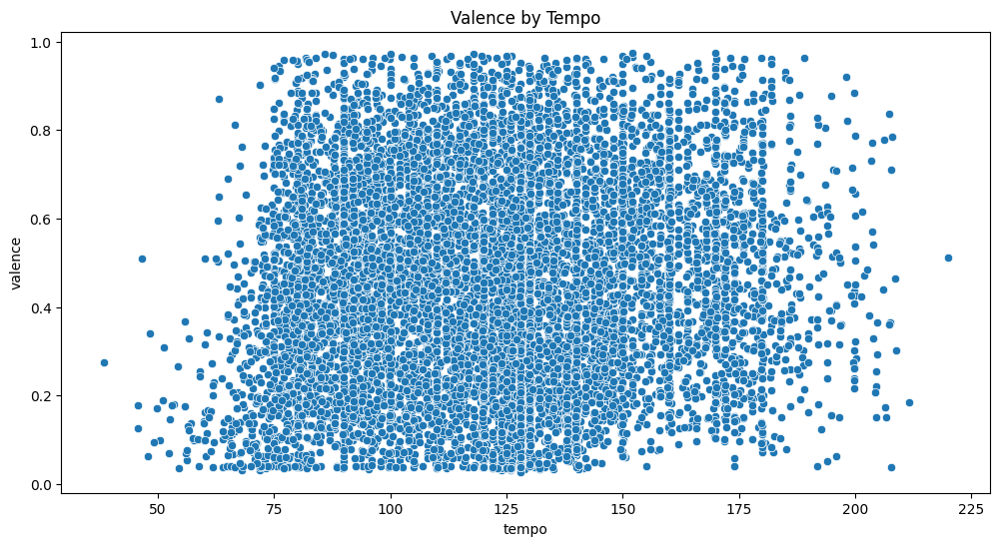

PearsonRResult(statistic=0.0818536644131661, pvalue=5.438375379905182e-19)


In [132]:
# Valence vs tempo
plt.figure(figsize=(12,6))
sns.scatterplot(x='tempo', y='valence', data=data)
plt.title('Valence by Tempo')
plt.show()
corr = pearsonr(data['tempo'], data['valence'])
print(corr)

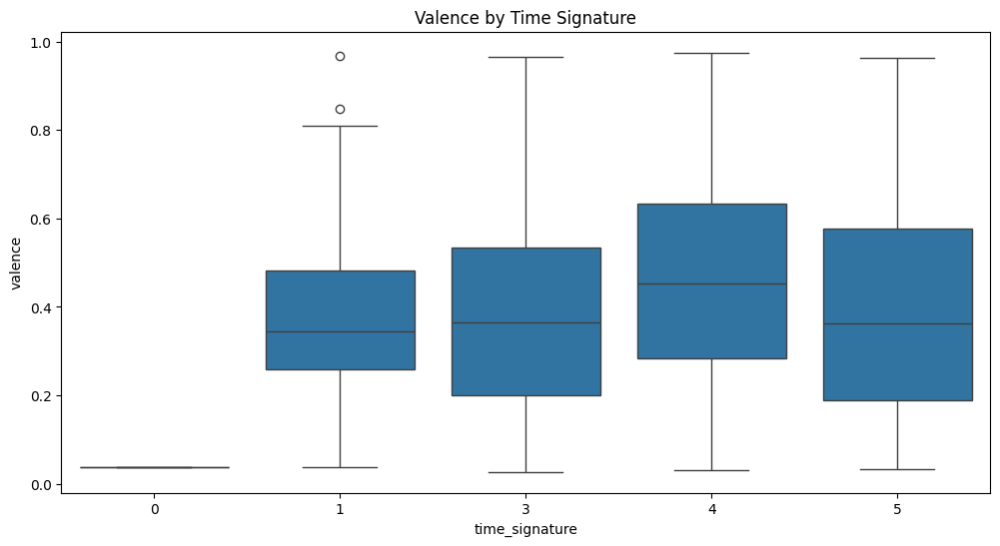

PearsonRResult(statistic=0.07140384712554168, pvalue=8.279307130202804e-15)


In [133]:
# Valence vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='valence', data=data)
plt.title('Valence by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['valence'])
print(corr)

<h1> Independant Vs Independant (Tempo) </h1>

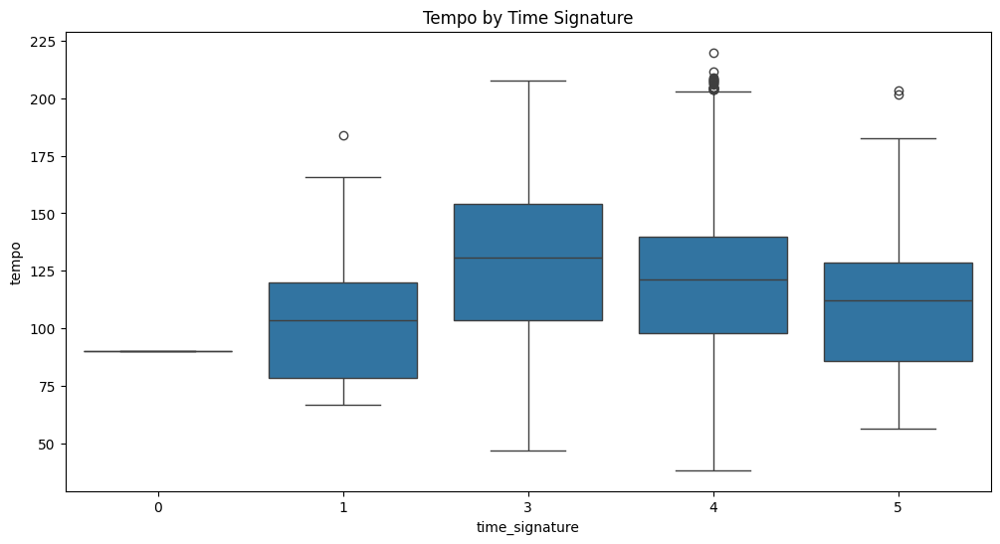

PearsonRResult(statistic=-0.02185212427688402, pvalue=0.017640638320245414)


In [134]:
# Tempo vs time_signature
plt.figure(figsize=(12,6))
sns.boxplot(x='time_signature', y='tempo', data=data)
plt.title('Tempo by Time Signature')
plt.show()
corr = pearsonr(data['time_signature'], data['tempo'])
print(corr)

<h1>----------------</h1>

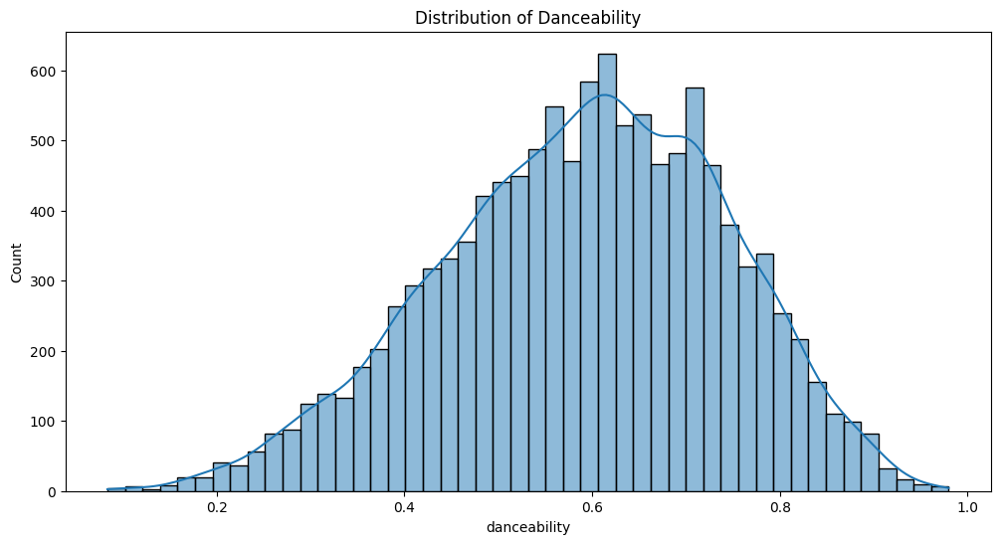

In [135]:
# Histogram of danceability
plt.figure(figsize=(12,6))
sns.histplot(data['danceability'], kde=True)
plt.title('Distribution of Danceability')
plt.show()

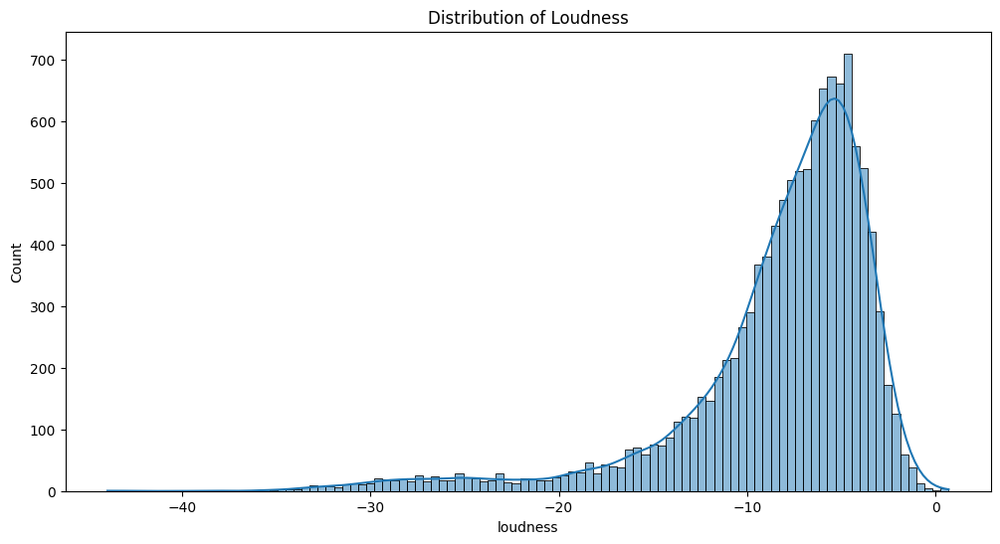

In [136]:
#Histogram of Loudness
plt.figure(figsize=(12,6))
sns.histplot(data['loudness'], kde=True)
plt.title('Distribution of Loudness')
plt.show()

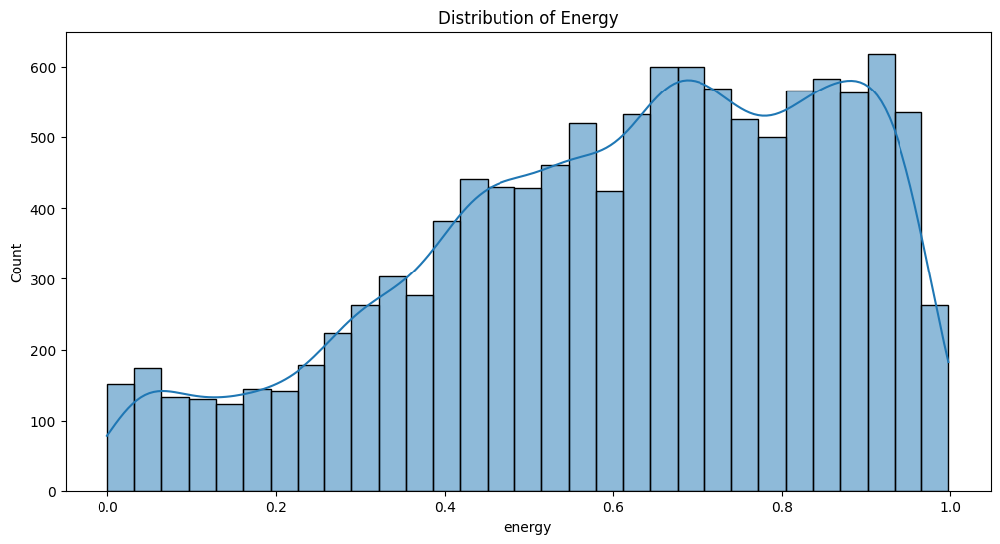

In [137]:
# Histogram of Energy
plt.figure(figsize=(12,6))
sns.histplot(data['energy'], kde=True)
plt.title('Distribution of Energy')
plt.show()

<h1>Cluster Analysis & PCA</h1>

In [140]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch
import seaborn as sns


ValueError: could not convert string to float: '1gUAX2ImxDsB3YDcyxMXlB'

<Figure size 1200x600 with 0 Axes>